In [1]:
import gemma_utils
import simple_acdc
import importlib

model, _ = gemma_utils.load_gemma_model()

/Users/andrewgomes/Documents/LLMConstructions/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


All required packages imported successfully!
Loading Gemma 2 model and tokenizer...


`torch_dtype` is deprecated! Use `dtype` instead!
Loading checkpoint shards: 100%|██████████| 3/3 [00:00<00:00, 55.50it/s]


Loaded pretrained model google/gemma-2-2b into HookedTransformer
✅ Model and tokenizer loaded successfully!


In [17]:
importlib.reload(gemma_utils)
importlib.reload(simple_acdc)

All required packages imported successfully!


<module 'simple_acdc' from '/Users/andrewgomes/Documents/LLMConstructions/simple_acdc.py'>

# Kicked the Bucket

In [19]:
original_text = "He kicked the bucket"
min_token_pos = 2
target_text="He died"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' kicked', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' bucket', top_k=50)

Original text tokens: ['<bos>', 'He', ' kicked', ' the', ' bucket']
Token at position 2: ' kicked'
Target token: ' kicked' (ID: 38621)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' kicked':
------------------------------------------------------------
 1. Token ID  38621: ' kicked' (similarity: 1.0000)
 2. Token ID  47971: ' kicks' (similarity: 0.7766)
 3. Token ID  57692: ' kicking' (similarity: 0.7603)
 4. Token ID  12656: ' kick' (similarity: 0.7388)
 5. Token ID  41926: 'kick' (similarity: 0.7089)
 6. Token ID  43486: ' Kick' (similarity: 0.6677)
 7. Token ID 231188: ' KICK' (similarity: 0.6665)
 8. Token ID  59477: 'Kick' (similarity: 0.6664)
 9. Token ID 201584: 'kicks' (similarity: 0.5935)
10. Token ID 197837: ' Kicks' (similarity: 0.5630)
11. Token ID 186808: ' booted' (similarity: 0.5117)
12. Token ID 165613: ' kickoff' (similarity: 0.5108)
13. Token ID 229633: 'キック' (similarity: 0.4933)
14. Token 

Analyzing similarities to target sentence: 'He died'
Comparing 5 sentences across layers...


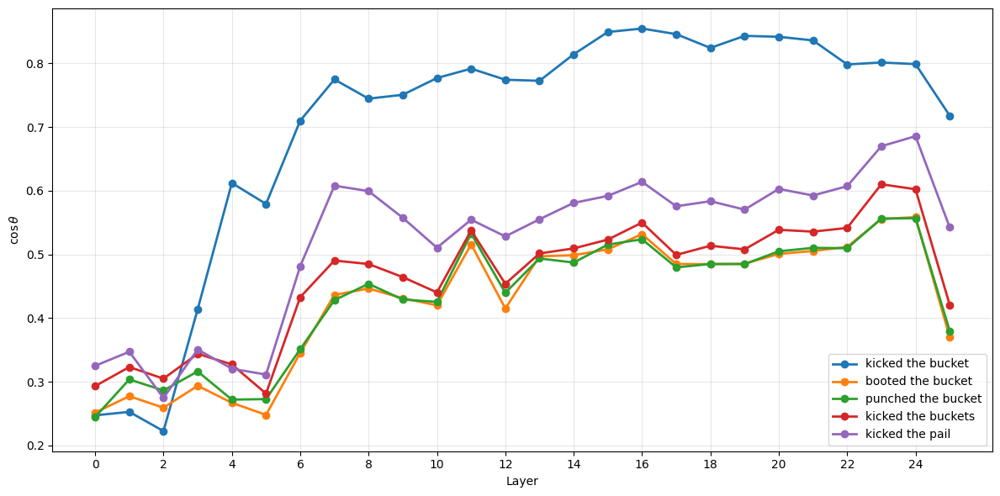

In [20]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["He kicked the bucket", "He booted the bucket", "He punched the bucket", "He kicked the buckets", "He kicked the pail"],
                                     target_sentence=target_text,
                                     min_token_pos=min_token_pos)

In [21]:
max_layer = 4
corrupted_texts = ["He booted the bucket", "He punched the bucket", "He kicked the buckets", "He kicked the pail"]

Threshold Sweep: 100%|██████████| 20/20 [02:38<00:00,  7.95s/it]


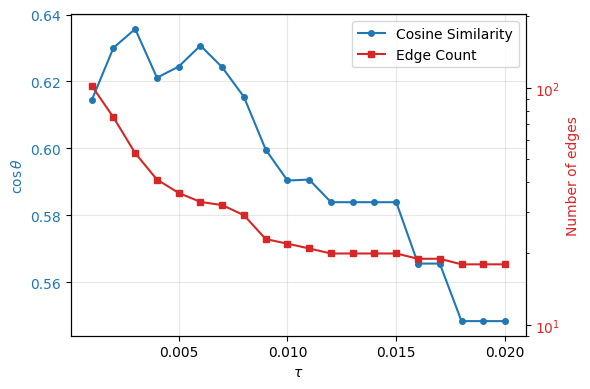

Threshold Sweep: 100%|██████████| 20/20 [02:52<00:00,  8.64s/it]


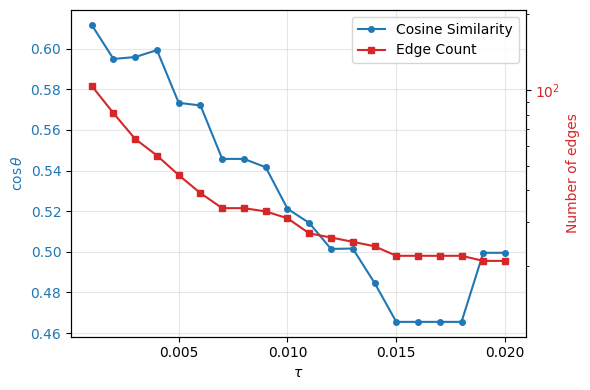

Threshold Sweep: 100%|██████████| 20/20 [01:44<00:00,  5.22s/it]


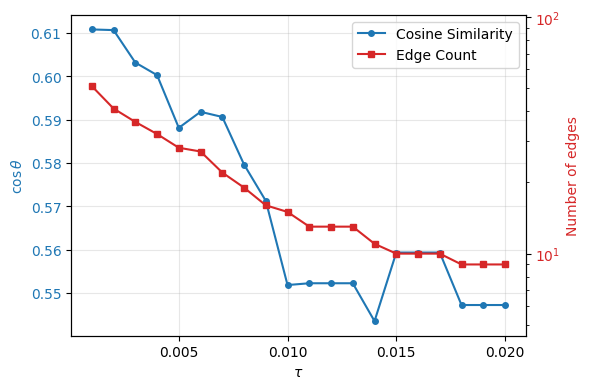

Threshold Sweep: 100%|██████████| 20/20 [01:38<00:00,  4.94s/it]


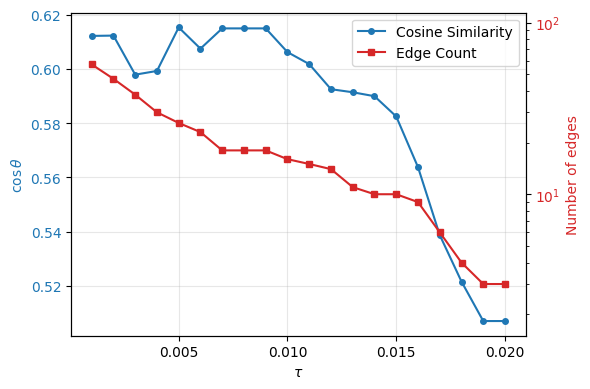

In [6]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.02, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

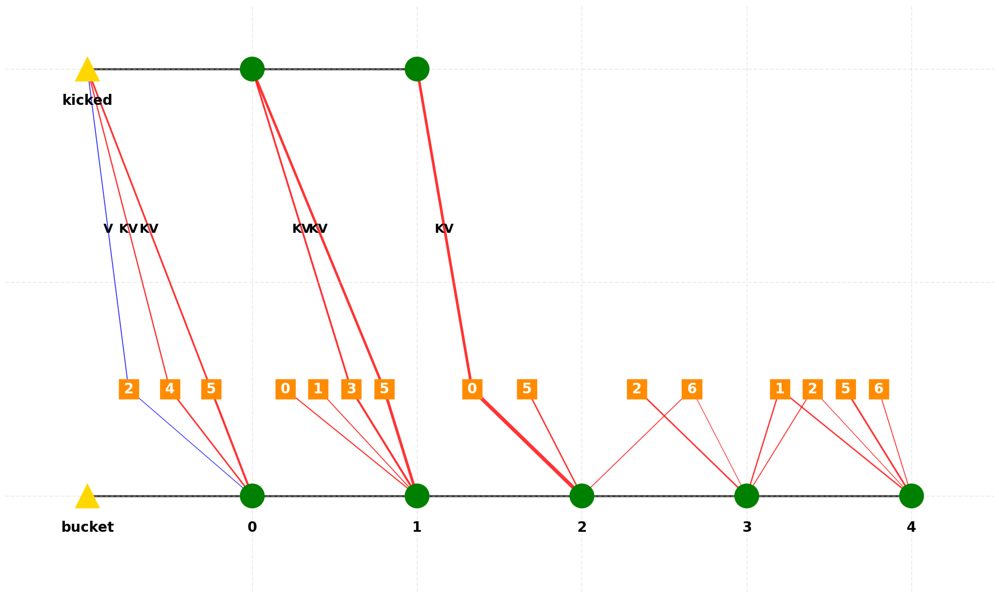

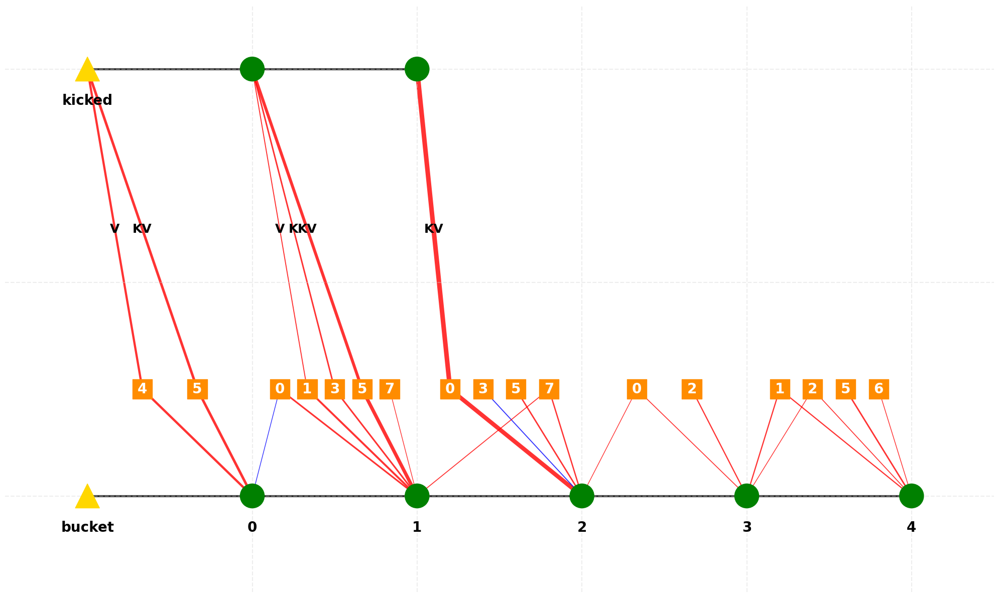

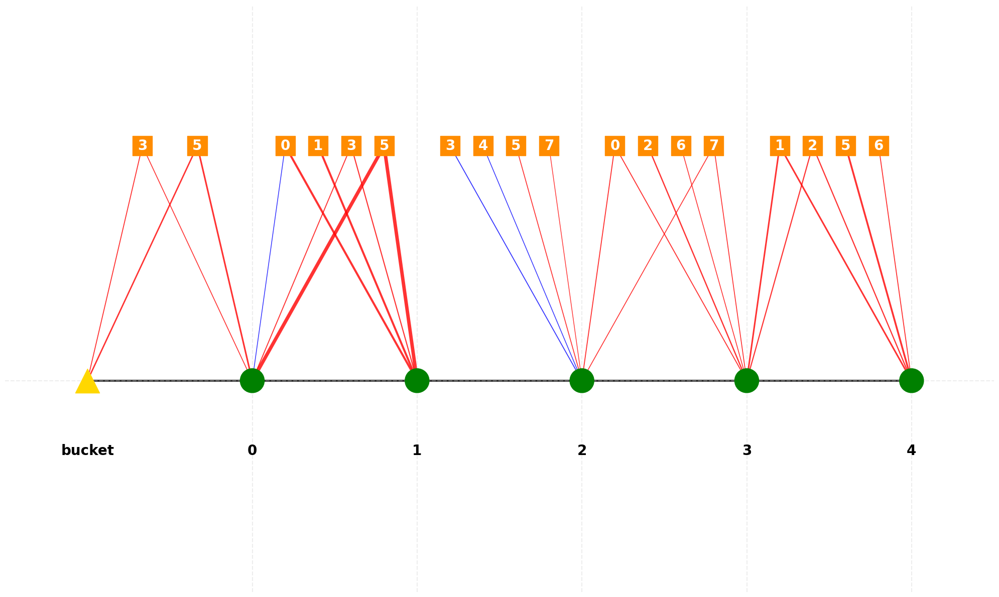

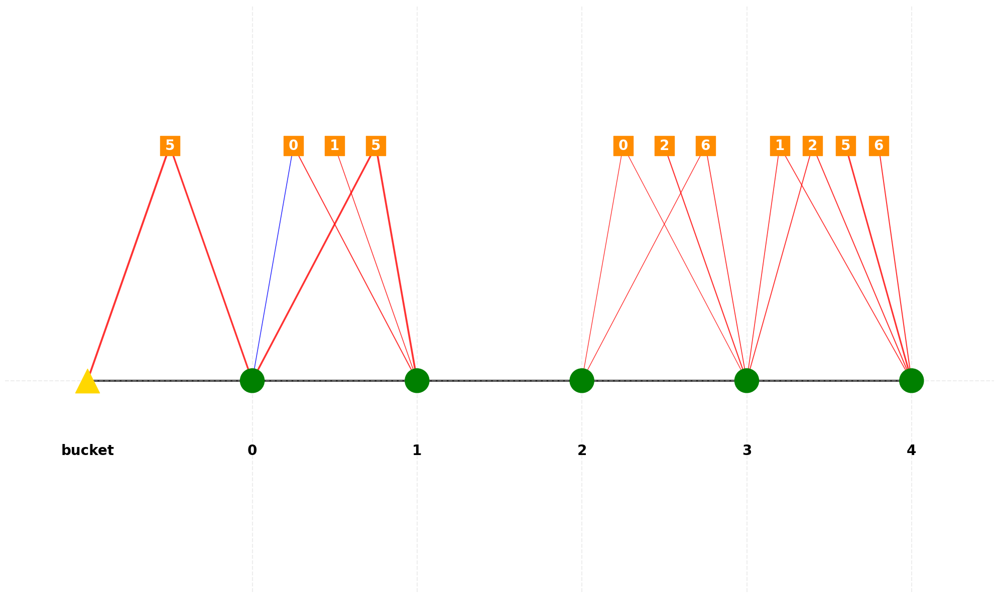

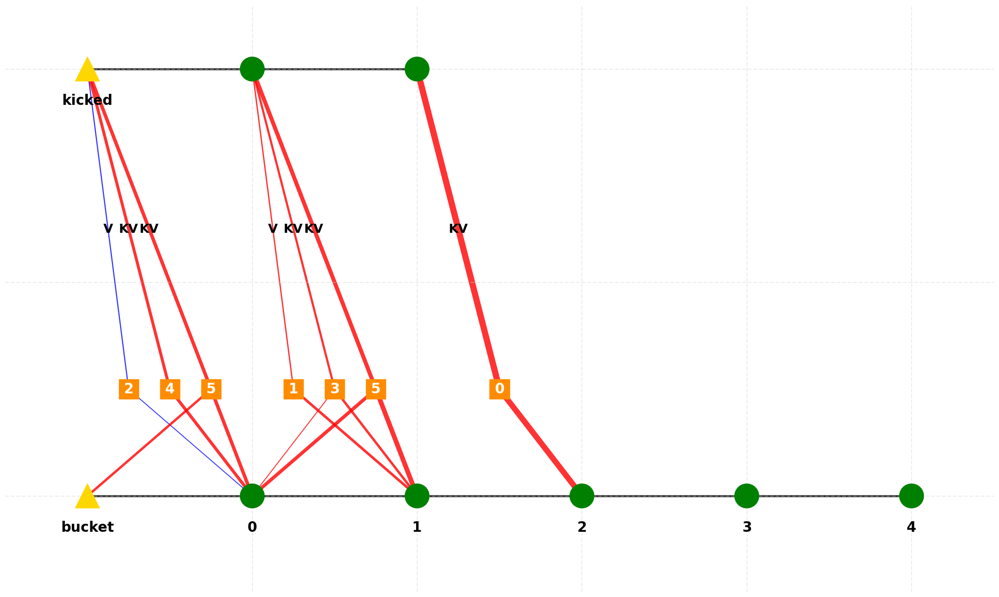


Circuit Summary:
Nodes: 16
Edges: 29

Attention Output Edges by effect size:
  L2H0_T4 → L2_T4 (attn_out): 0.1991
  L1H5_T4 → L1_T4 (attn_out): 0.1422
  L0H5_T4 → L0_T4 (attn_out): 0.0855
  L0H4_T4 → L0_T4 (attn_out): 0.0714
  L1H1_T4 → L1_T4 (attn_out): 0.0539
  L1H3_T4 → L1_T4 (attn_out): 0.0478
  L0H2_T4 → L0_T4 (attn_out): -0.0089

Query/Key/Value Edges by effect size:
  L1_T2 → L2H0_T4 (key): 0.2291
  L0_T2 → L1H5_T4 (key): 0.1114
  Embed_T2 → L0H5_T4 (value): 0.0868
  L0_T4 → L1H5_T4 (query): 0.0855
  Embed_T2 → L0H4_T4 (value): 0.0668
  Embed_T2 → L0H5_T4 (key): 0.0516
  Embed_T4 → L0H5_T4 (query): 0.0478
  L0_T2 → L1H3_T4 (value): 0.0395
  L0_T2 → L1H3_T4 (key): 0.0353
  L1_T2 → L2H0_T4 (value): 0.0293
  L0_T2 → L1H5_T4 (value): 0.0242
  L0_T2 → L1H1_T4 (value): 0.0171
  Embed_T2 → L0H2_T4 (value): -0.0130
  Embed_T2 → L0H4_T4 (key): 0.0103
  L0_T4 → L1H3_T4 (query): 0.0100


In [22]:
thresholds = [0.008, 0.010, 0.006, 0.009]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

# acdc_visualizer = simple_acdc.SimpleACDC(model, max_layer=max_layer, threshold=min(thresholds), corrupt_q=True, separate_kv=True)
# acdc_visualizer.visualize_circuit(merged_circuit, 
#                                 #  save_path="circuits/merged_circuit.png",
#                                  min_token_pos=min_token_pos)

In [8]:
all_texts = [original_text] + corrupted_texts
dot_products = simple_acdc.compute_qk_dot_products(
    model=model,
    texts=all_texts,
    layer=2,
    head_idx=0,
    q_index=4,
    k_index=2  
)
print(sum(dot_products[1:3])/2)
print(sum(dot_products[3:5])/2)

Computing Q-K dot products for Layer 2, Head 0 (Q@4, K@2):
Q token at position 4: ' bucket'
K token at position 2: ' kicked'
--------------------------------------------------------------------------------
'He kicked the bucket' -> 72.441681
'He booted the bucket' -> 38.190460
'He punched the bucket' -> 17.655960
'He kicked the buckets' -> 66.459595
'He kicked the pail' -> 65.332489
--------------------------------------------------------------------------------
27.92321014404297
65.89604187011719


## 'the' Corruption

In [23]:
corrupted_texts_the = ["He kicked a bucket", "He kicked this bucket"]

Threshold Sweep: 100%|██████████| 20/20 [01:58<00:00,  5.91s/it]


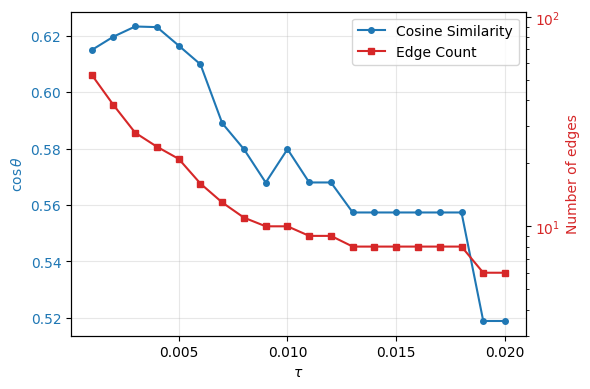

Threshold Sweep: 100%|██████████| 20/20 [01:36<00:00,  4.81s/it]


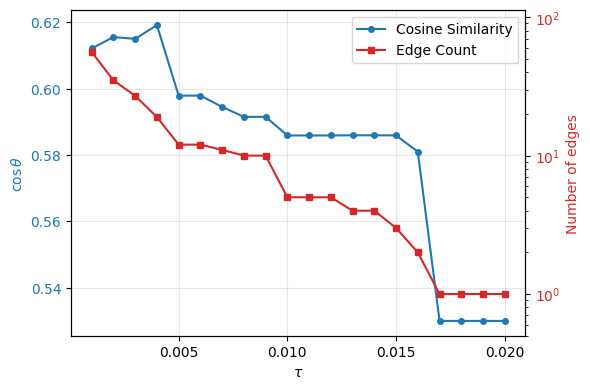

In [10]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts_the,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.02, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

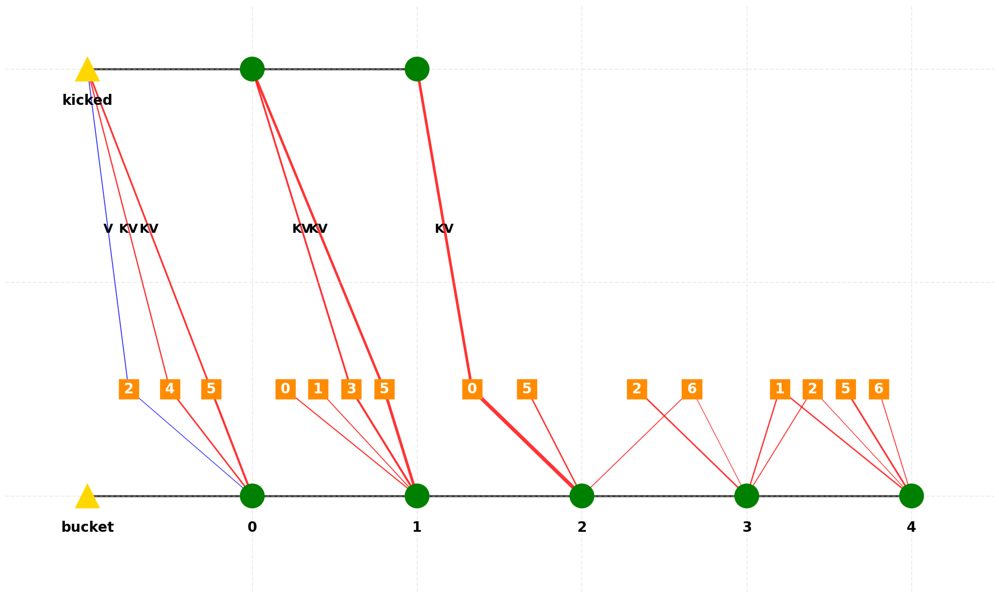

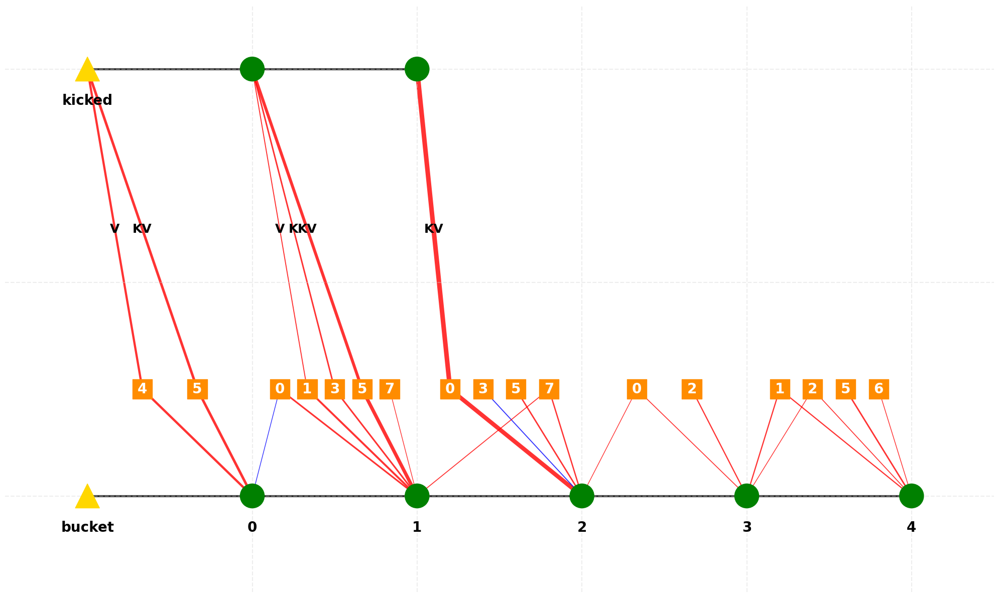

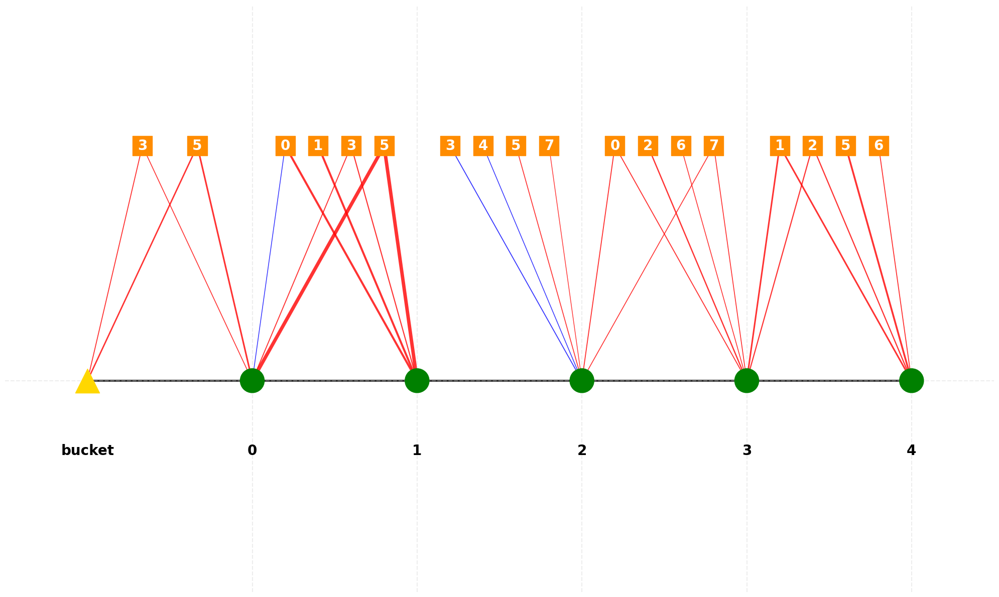

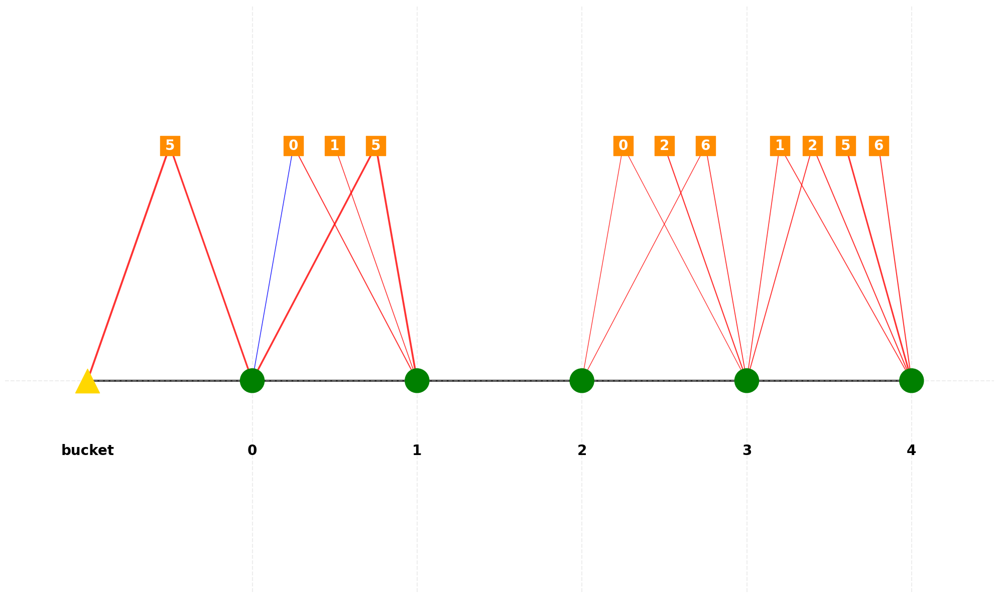

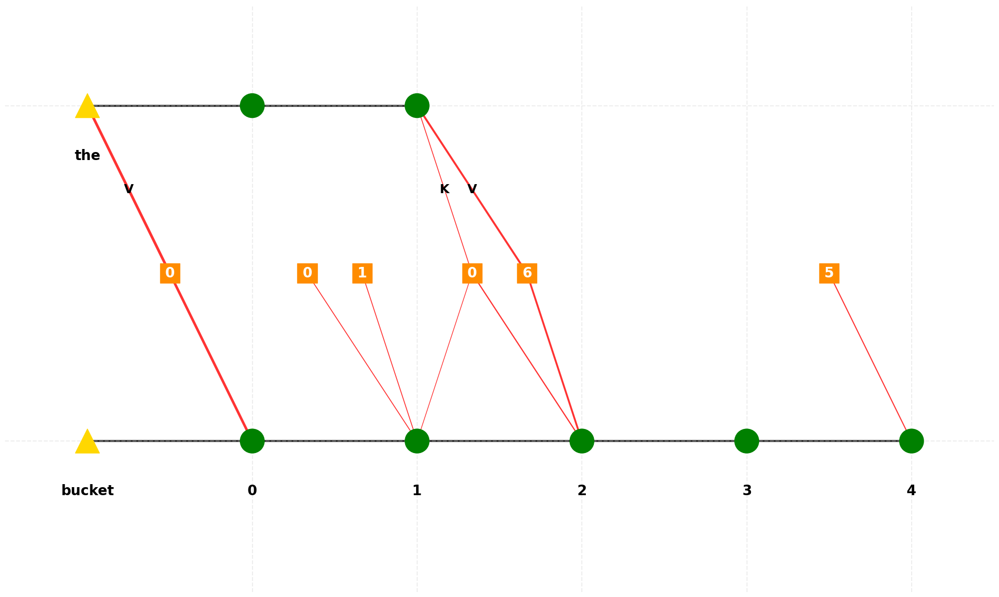

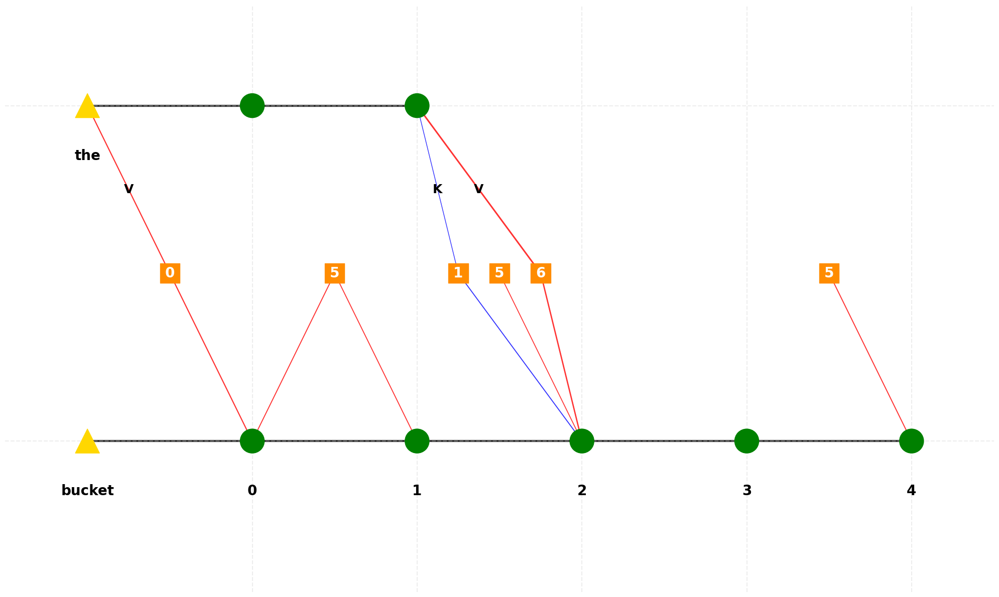

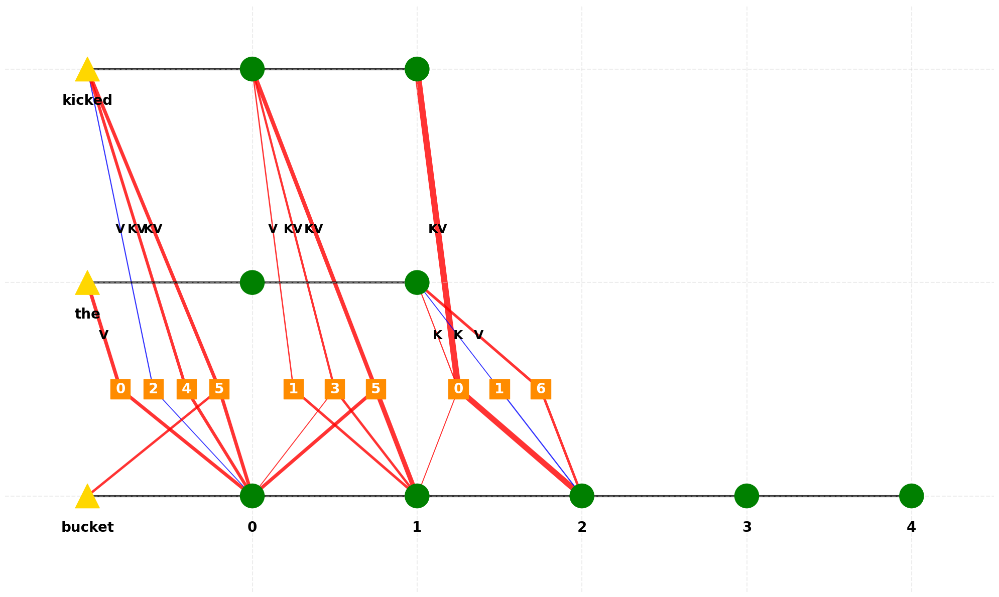


Circuit Summary:
Nodes: 22
Edges: 39

Attention Output Edges by effect size:
  L2H0_T4 → L2_T4 (attn_out): 0.1991
  L1H5_T4 → L1_T4 (attn_out): 0.1422
  L0H5_T4 → L0_T4 (attn_out): 0.0855
  L0H0_T4 → L0_T4 (attn_out): 0.0846
  L0H4_T4 → L0_T4 (attn_out): 0.0714
  L1H1_T4 → L1_T4 (attn_out): 0.0539
  L2H6_T4 → L2_T4 (attn_out): 0.0512
  L1H3_T4 → L1_T4 (attn_out): 0.0478
  L2H1_T4 → L2_T4 (attn_out): -0.0147
  L0H2_T4 → L0_T4 (attn_out): -0.0089

Query/Key/Value Edges by effect size:
  L1_T2 → L2H0_T4 (key): 0.2291
  L0_T2 → L1H5_T4 (key): 0.1114
  Embed_T3 → L0H0_T4 (value): 0.0912
  Embed_T2 → L0H5_T4 (value): 0.0868
  L0_T4 → L1H5_T4 (query): 0.0855
  Embed_T2 → L0H4_T4 (value): 0.0668
  L1_T3 → L2H6_T4 (value): 0.0563
  Embed_T2 → L0H5_T4 (key): 0.0516
  Embed_T4 → L0H5_T4 (query): 0.0478
  L0_T2 → L1H3_T4 (value): 0.0395
  L0_T2 → L1H3_T4 (key): 0.0353
  L1_T2 → L2H0_T4 (value): 0.0293
  L0_T2 → L1H5_T4 (value): 0.0242
  L0_T2 → L1H1_T4 (value): 0.0171
  L1_T3 → L2H0_T4 (key): 0.0

In [24]:
thresholds_the = [0.010, 0.009]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts+corrupted_texts_the,
    target_text=target_text,
    thresholds=thresholds+thresholds_the,
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

# A Piece of Cake

In [12]:
original_text = "That was a piece of cake"
min_token_pos = 4
target_text="That was easy"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' piece', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' of', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' cake', top_k=50)

Original text tokens: ['<bos>', 'That', ' was', ' a', ' piece', ' of', ' cake']
Token at position 4: ' piece'
Target token: ' piece' (ID: 6431)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' piece':
------------------------------------------------------------
 1. Token ID   6431: ' piece' (similarity: 1.0000)
 2. Token ID  17143: 'piece' (similarity: 0.7959)
 3. Token ID   9308: ' pieces' (similarity: 0.7638)
 4. Token ID  38669: ' Piece' (similarity: 0.7489)
 5. Token ID  36992: 'Piece' (similarity: 0.7231)
 6. Token ID 163978: ' PIECE' (similarity: 0.7213)
 7. Token ID  40192: 'pieces' (similarity: 0.6204)
 8. Token ID  66337: ' Pieces' (similarity: 0.5879)
 9. Token ID  94628: 'Pieces' (similarity: 0.5575)
10. Token ID  62800: ' pieza' (similarity: 0.5344)
11. Token ID 206148: 'PIECE' (similarity: 0.5160)
12. Token ID 150685: ' pezzo' (similarity: 0.4538)
13. Token ID  33382: ' piezas' (similarity: 0.436

Analyzing similarities to target sentence: 'That was easy'
Comparing 7 sentences across layers...


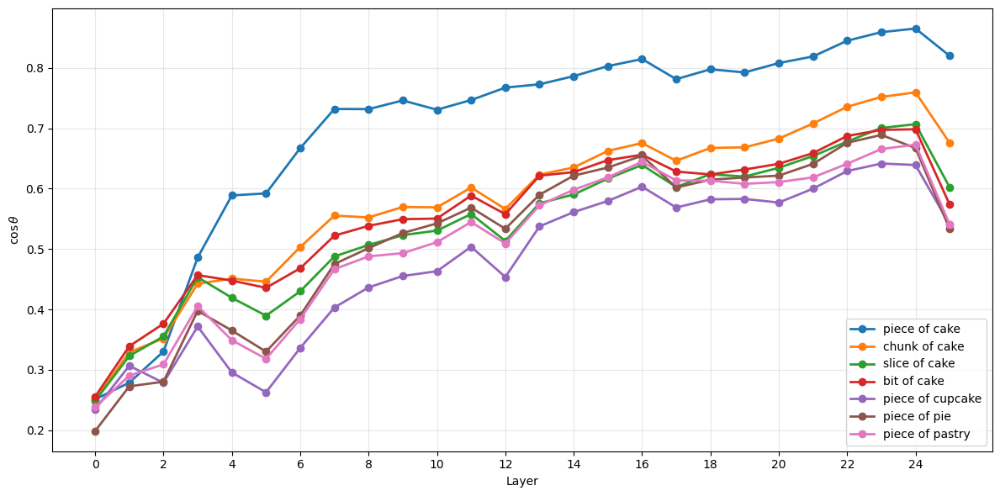

In [13]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["That was a piece of cake", "That was a chunk of cake", "That was a slice of cake", "That was a bit of cake", "That was a piece of cupcake", "That was a piece of pie", "That was a piece of pastry"],
                                     target_sentence=target_text,
                                     min_token_pos=min_token_pos)

In [14]:
max_layer = 4
corrupted_texts = ["That was a chunk of cake", "That was a slice of cake", "That was a piece of cupcake", "That was a piece of pie"]

Threshold Sweep: 100%|██████████| 20/20 [01:59<00:00,  5.96s/it]


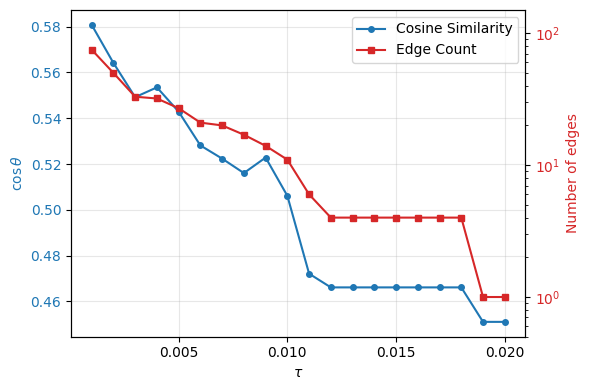

Threshold Sweep: 100%|██████████| 20/20 [01:42<00:00,  5.14s/it]


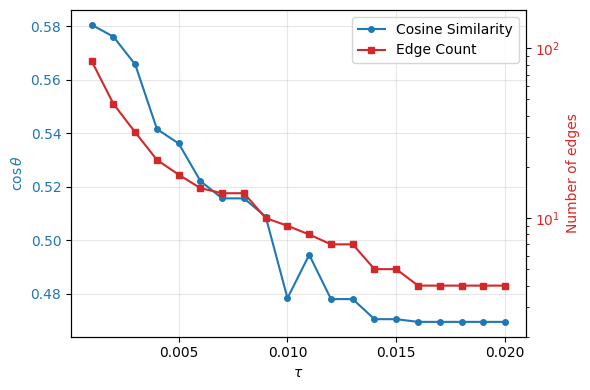

Threshold Sweep: 100%|██████████| 20/20 [01:32<00:00,  4.62s/it]


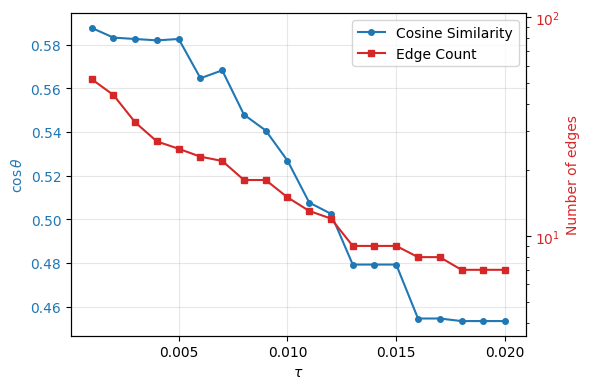

Threshold Sweep: 100%|██████████| 20/20 [01:16<00:00,  3.84s/it]


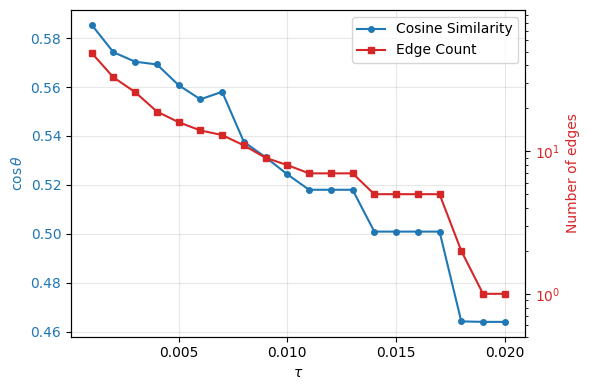

In [15]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.02, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

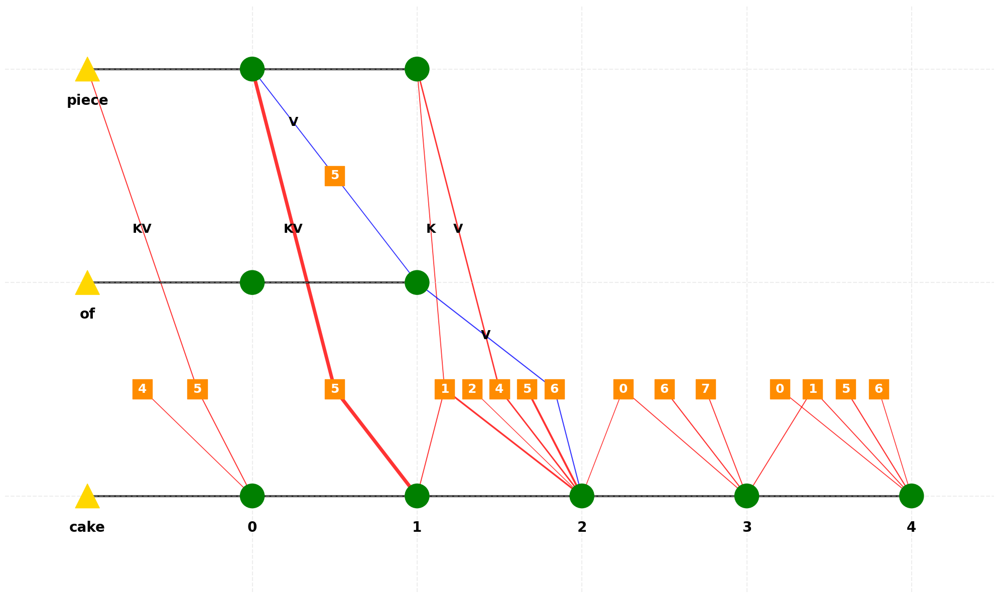

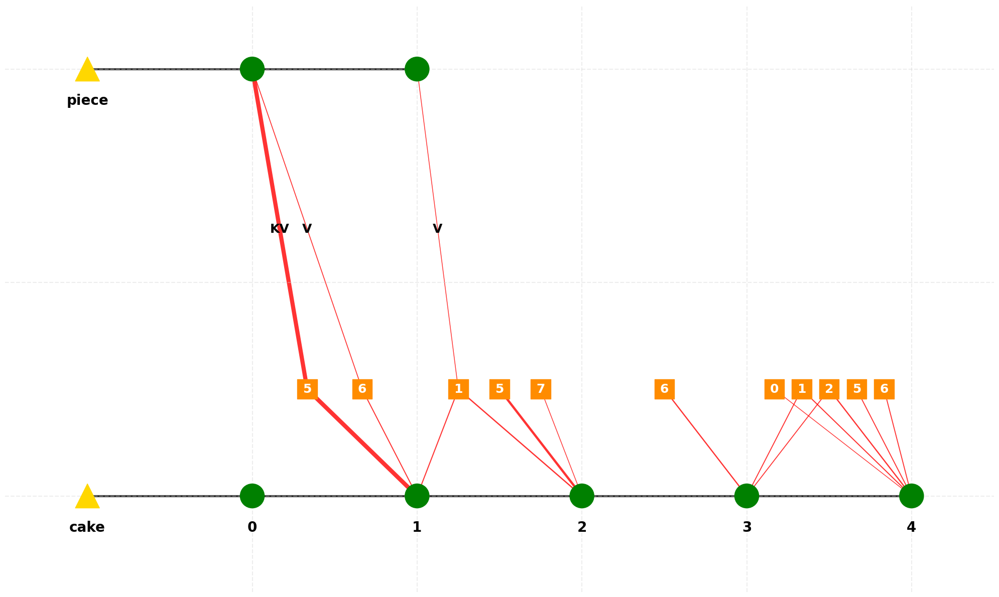

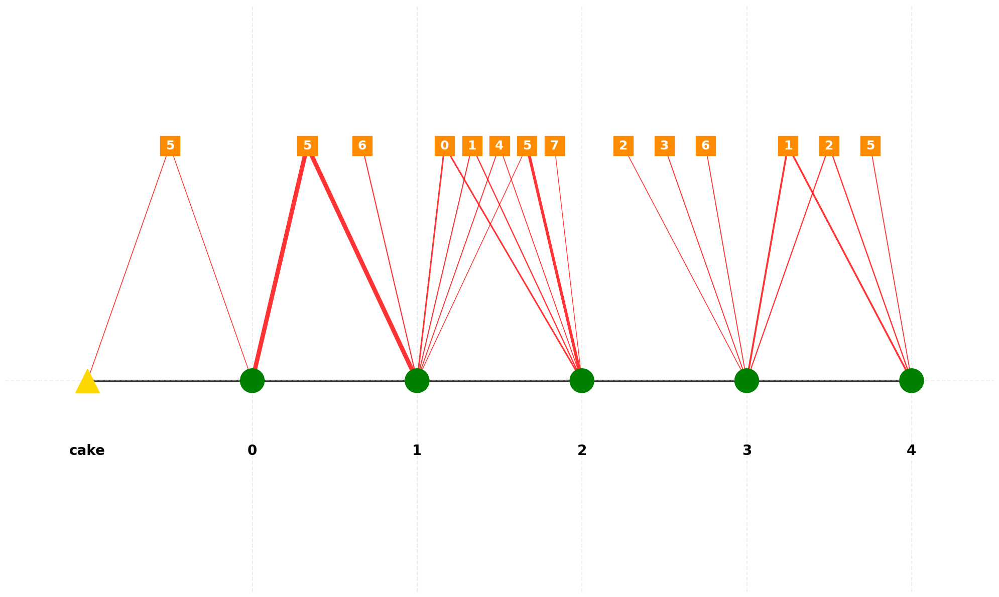

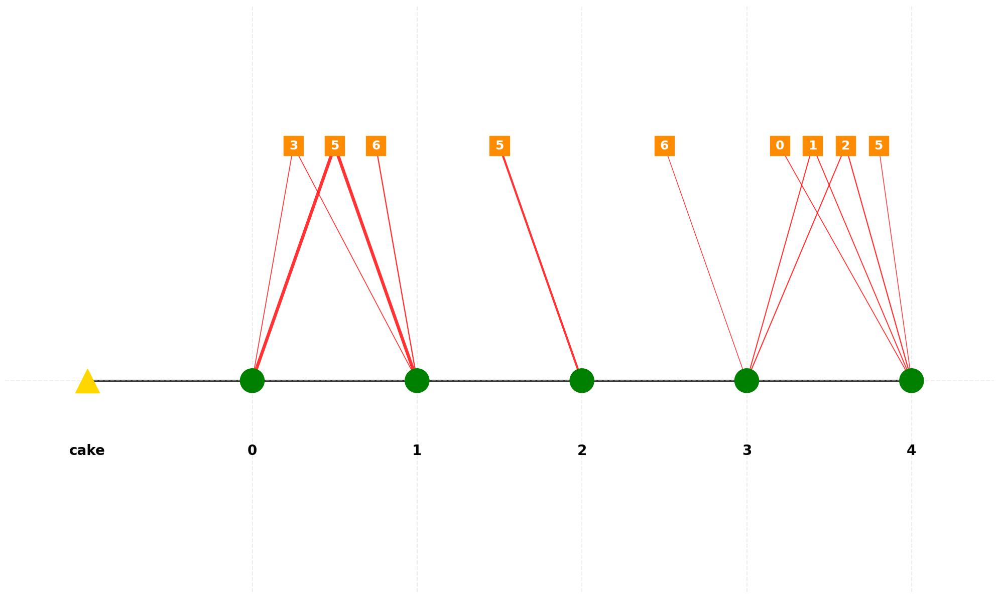

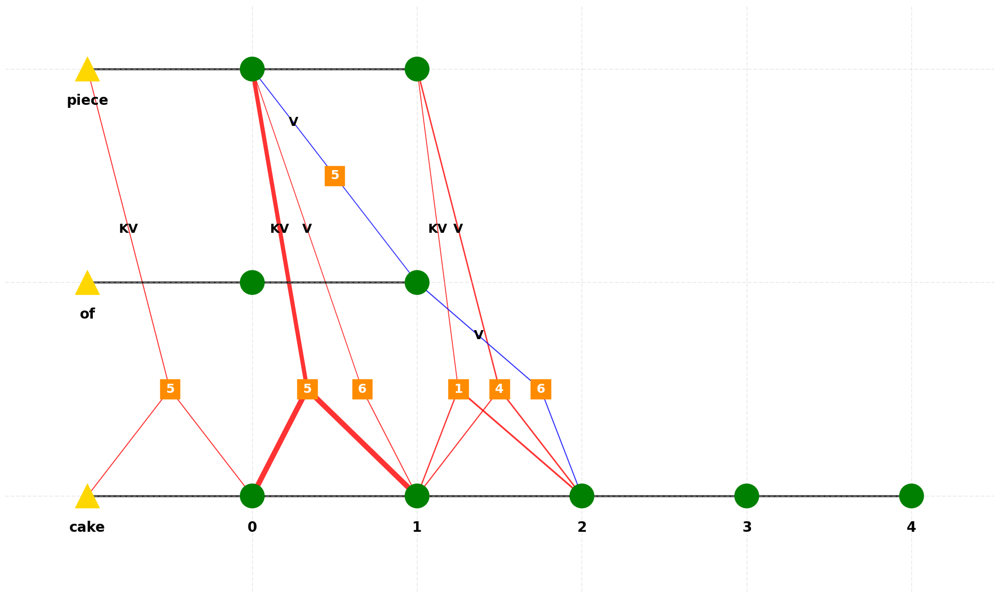


Circuit Summary:
Nodes: 19
Edges: 30

Attention Output Edges by effect size:
  L1H5_T6 → L1_T6 (attn_out): 0.1486
  L2H1_T6 → L2_T6 (attn_out): 0.0219
  L2H4_T6 → L2_T6 (attn_out): 0.0168
  L2H6_T6 → L2_T6 (attn_out): -0.0096
  L0H5_T6 → L0_T6 (attn_out): 0.0090
  L1H6_T6 → L1_T6 (attn_out): 0.0090
  L1H5_T5 → L1_T5 (attn_out): -0.0080

Query/Key/Value Edges by effect size:
  L0_T6 → L1H5_T6 (query): 0.1482
  L0_T4 → L1H5_T6 (key): 0.0980
  L0_T4 → L1H5_T6 (value): 0.0358
  L1_T4 → L2H4_T6 (value): 0.0158
  L1_T6 → L2H1_T6 (query): 0.0134
  L1_T6 → L2H4_T6 (query): 0.0113
  L1_T5 → L2H6_T6 (value): -0.0102
  Embed_T6 → L0H5_T6 (query): 0.0090
  Embed_T4 → L0H5_T6 (value): 0.0088
  L0_T4 → L1H5_T5 (value): -0.0086
  L1_T4 → L2H1_T6 (key): 0.0076
  L0_T4 → L1H6_T6 (value): 0.0069
  L1_T4 → L2H1_T6 (value): 0.0055
  Embed_T4 → L0H5_T6 (key): 0.0054


In [16]:
thresholds = [0.005, 0.005, 0.007, 0.007]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

# Hit the Sack

In [113]:
original_text = "He hit the sack"
min_token_pos = 2
target_text="He went to sleep"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' hit', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' sack', top_k=50)

Original text tokens: ['<bos>', 'He', ' hit', ' the', ' sack']
Token at position 2: ' hit'
Target token: ' hit' (ID: 4887)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' hit':
------------------------------------------------------------
 1. Token ID   4887: ' hit' (similarity: 1.0000)
 2. Token ID  12580: 'hit' (similarity: 0.7744)
 3. Token ID  17403: ' hits' (similarity: 0.7373)
 4. Token ID  18076: ' Hit' (similarity: 0.7310)
 5. Token ID  20419: 'Hit' (similarity: 0.7224)
 6. Token ID  28571: ' hitting' (similarity: 0.6460)
 7. Token ID  96303: ' HIT' (similarity: 0.5372)
 8. Token ID  61534: 'hits' (similarity: 0.5230)
 9. Token ID  96685: 'HIT' (similarity: 0.5055)
10. Token ID  71770: ' Hits' (similarity: 0.4910)
11. Token ID 180040: 'hitting' (similarity: 0.4693)
12. Token ID  57162: 'Hits' (similarity: 0.4466)
13. Token ID 132313: 'ヒット' (similarity: 0.4394)
14. Token ID  20425: ' struck' (similarit

Analyzing similarities to target sentence: 'He went to sleep'
Comparing 5 sentences across layers...


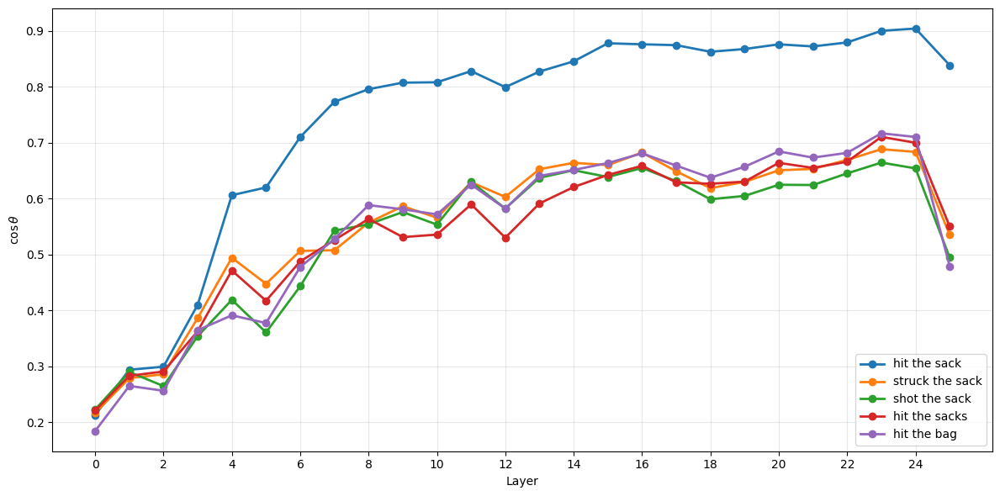

In [86]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["He hit the sack", "He struck the sack", "He shot the sack", "He hit the sacks", "He hit the bag"],
                                     target_sentence=target_text,
                                     min_token_pos=min_token_pos)

In [114]:
max_layer = 5
corrupted_texts = ["He struck the sack", "He shot the sack", "He hit the sacks", "He hit the bag"]

Threshold Sweep: 100%|██████████| 40/40 [04:04<00:00,  6.12s/it]


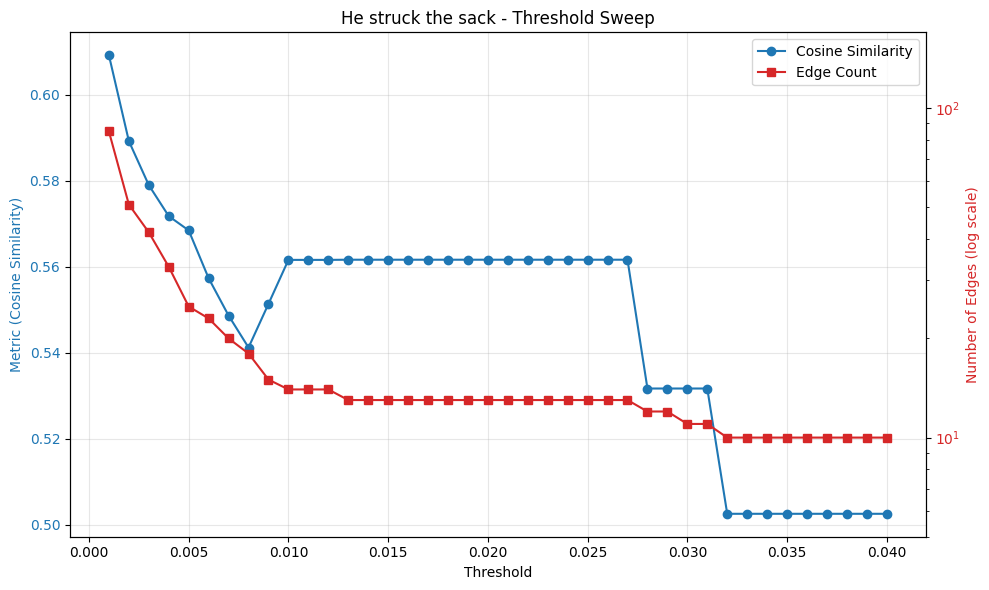

Threshold Sweep: 100%|██████████| 40/40 [04:33<00:00,  6.84s/it]


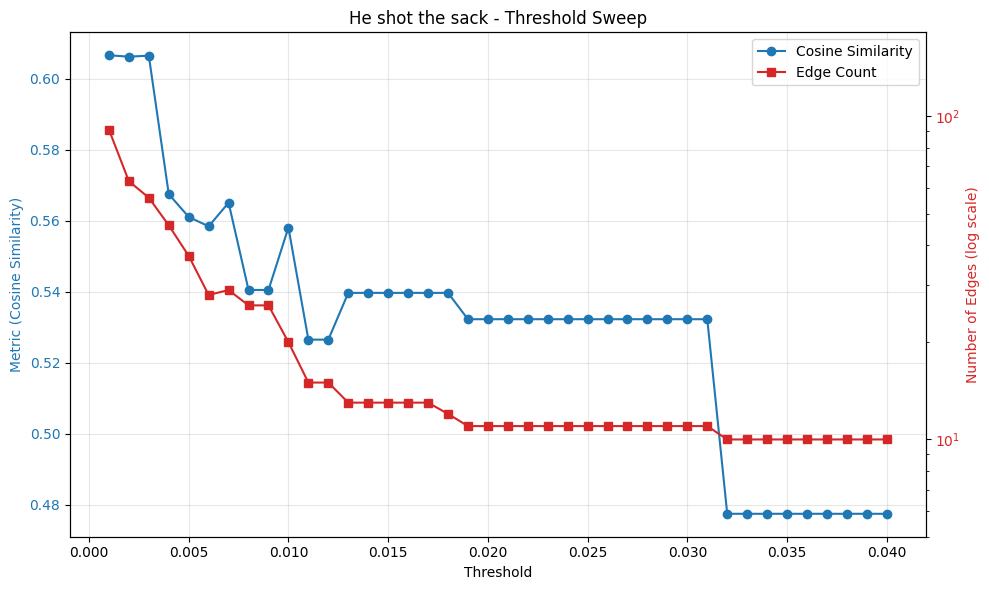

Threshold Sweep: 100%|██████████| 40/40 [03:01<00:00,  4.53s/it]


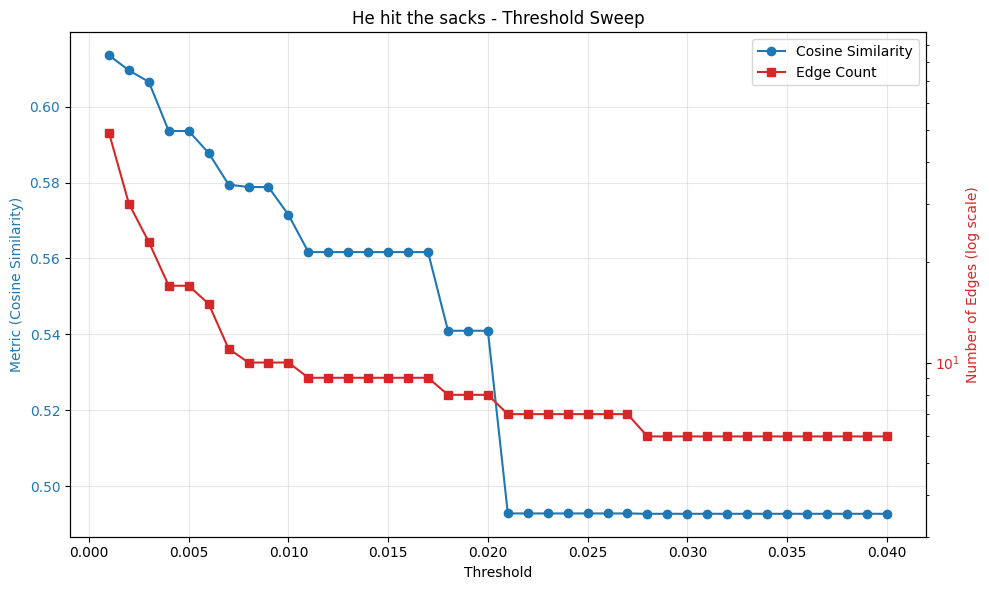

Threshold Sweep: 100%|██████████| 40/40 [03:24<00:00,  5.12s/it]


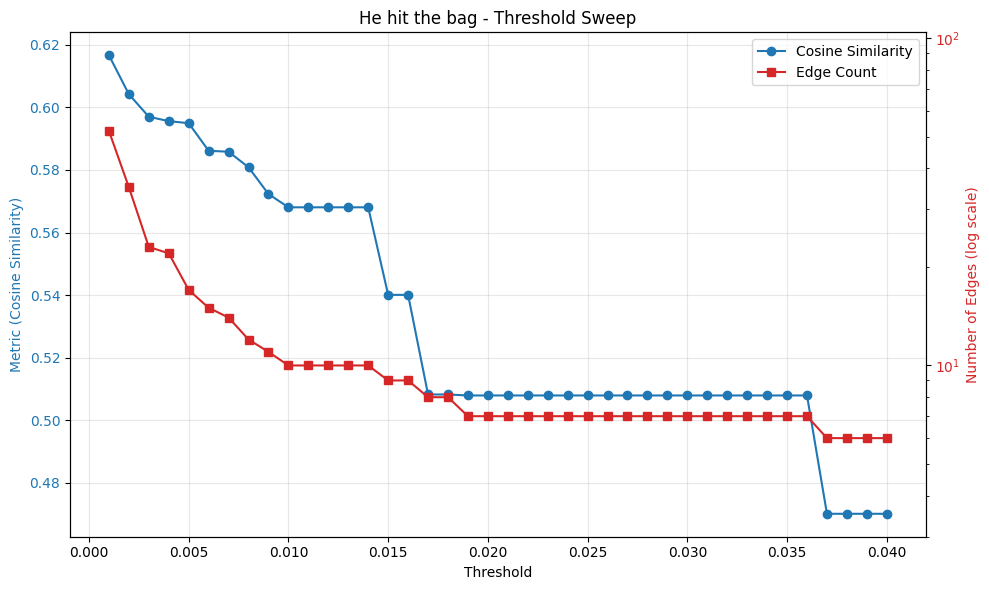

In [31]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.04, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

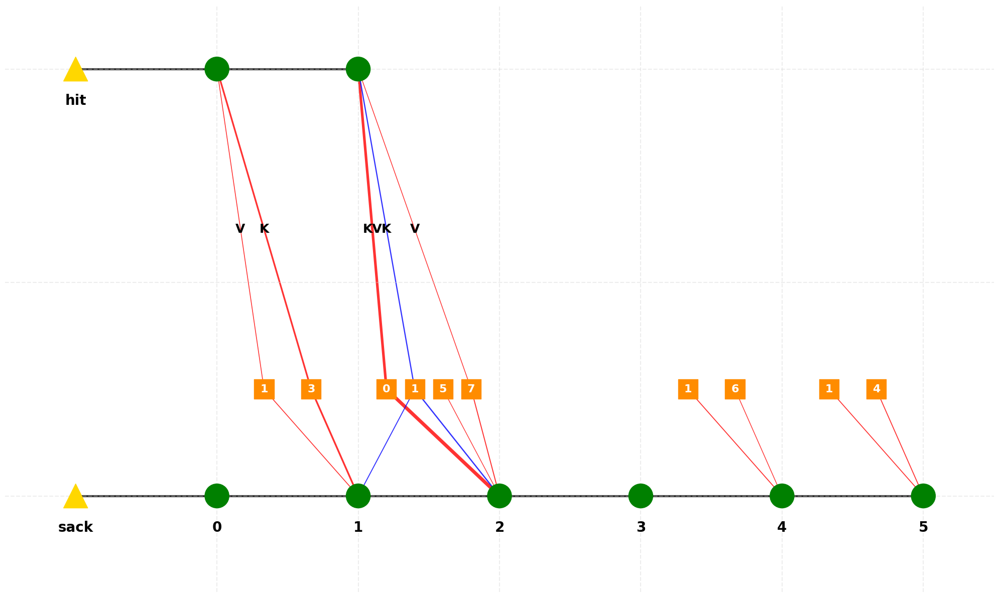

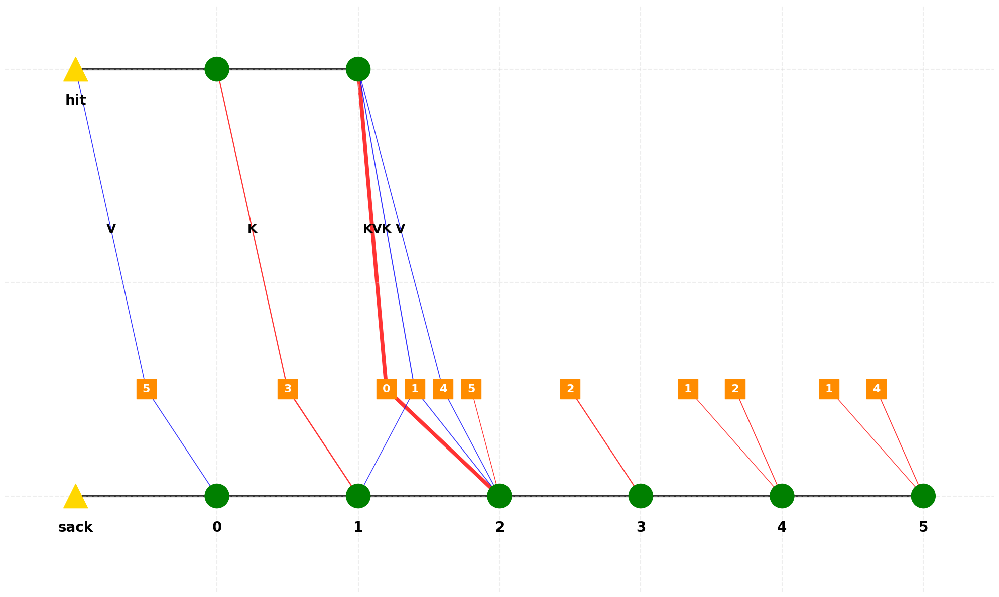

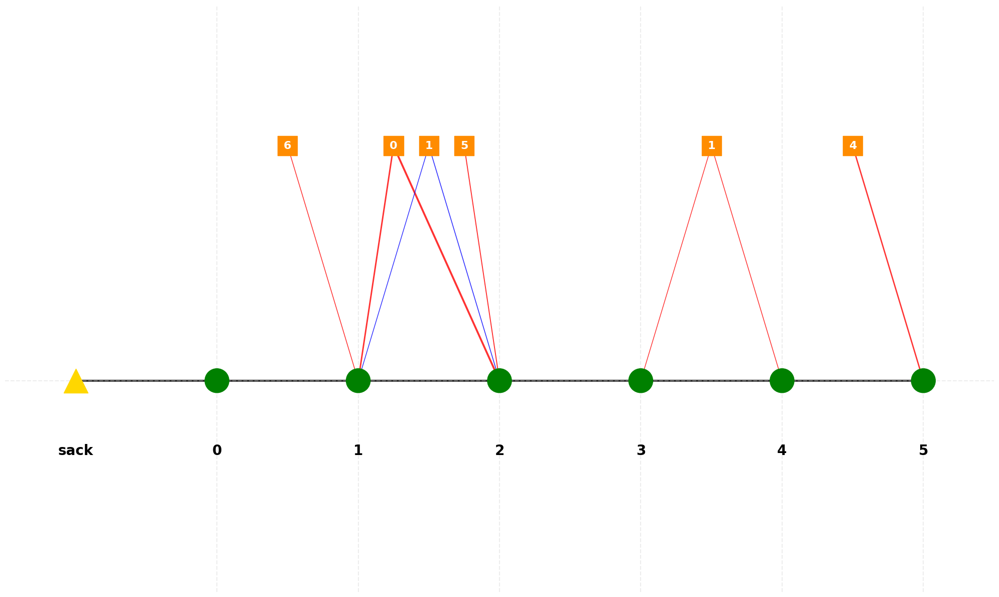

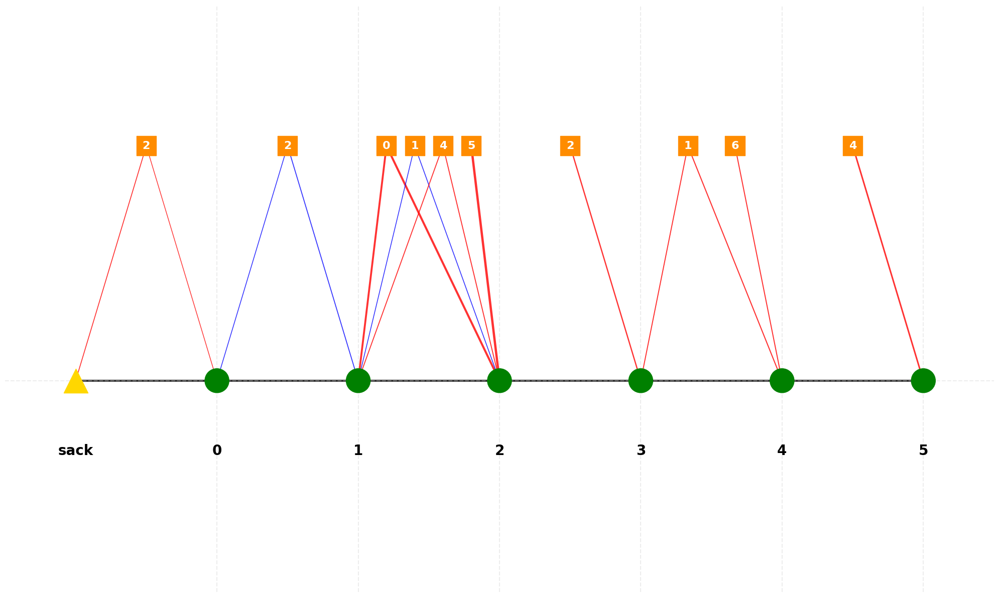

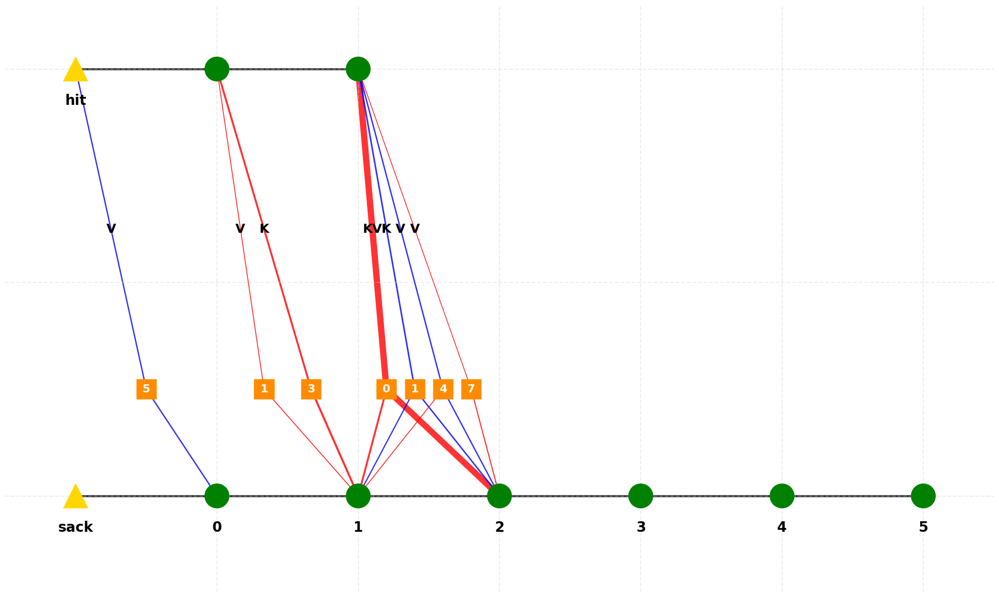


Circuit Summary:
Nodes: 17
Edges: 26

Attention Output Edges by effect size:
  L2H0_T4 → L2_T4 (attn_out): 0.1497
  L1H3_T4 → L1_T4 (attn_out): 0.0240
  L2H1_T4 → L2_T4 (attn_out): -0.0135
  L0H5_T4 → L0_T4 (attn_out): -0.0118
  L2H4_T4 → L2_T4 (attn_out): -0.0116
  L2H7_T4 → L2_T4 (attn_out): 0.0088
  L1H1_T4 → L1_T4 (attn_out): 0.0068

Query/Key/Value Edges by effect size:
  L1_T2 → L2H0_T4 (key): 0.1571
  L1_T2 → L2H0_T4 (value): 0.0418
  L0_T2 → L1H3_T4 (key): 0.0217
  L1_T4 → L2H0_T4 (query): 0.0213
  L1_T2 → L2H1_T4 (key): -0.0152
  L1_T2 → L2H4_T4 (value): -0.0123
  Embed_T2 → L0H5_T4 (value): -0.0117
  L1_T4 → L2H1_T4 (query): -0.0104
  L1_T4 → L2H4_T4 (query): 0.0064
  L0_T2 → L1H1_T4 (value): 0.0062
  L1_T2 → L2H7_T4 (value): 0.0055


In [88]:
thresholds = [0.005, 0.009, 0.006, 0.004]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

In [115]:
all_texts = [original_text] + corrupted_texts
dot_products = simple_acdc.compute_qk_dot_products(
    model=model,
    texts=all_texts,
    layer=2,
    head_idx=0,
    q_index=4,
    k_index=2  
)
print(sum(dot_products[1:3])/2)
print(sum(dot_products[3:5])/2)

Computing Q-K dot products for Layer 2, Head 0 (Q@4, K@2):
Q token at position 4: ' sack'
K token at position 2: ' hit'
--------------------------------------------------------------------------------
'He hit the sack' -> 80.928543
'He struck the sack' -> 50.183987
'He shot the sack' -> 18.266113
'He hit the sacks' -> 45.161388
'He hit the bag' -> 55.800259
--------------------------------------------------------------------------------
34.22504997253418
50.4808235168457


# Rocket Science

In [80]:
original_text = "It's not rocket science"
min_token_pos = 5
# target_text="Let's stop"
target_text="It's not difficult"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' rocket', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' science', top_k=50)

Original text tokens: ['<bos>', 'It', "'", 's', ' not', ' rocket', ' science']
Token at position 5: ' rocket'
Target token: ' rocket' (ID: 33756)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' rocket':
------------------------------------------------------------
 1. Token ID  33756: ' rocket' (similarity: 1.0000)
 2. Token ID  60810: 'rocket' (similarity: 0.7688)
 3. Token ID  51214: ' Rocket' (similarity: 0.7653)
 4. Token ID  86691: ' rockets' (similarity: 0.7533)
 5. Token ID  68699: 'Rocket' (similarity: 0.7325)
 6. Token ID 169998: '火箭' (similarity: 0.5630)
 7. Token ID 112085: ' Rockets' (similarity: 0.5448)
 8. Token ID  48814: ' missile' (similarity: 0.4828)
 9. Token ID 164332: ' ракет' (similarity: 0.4191)
10. Token ID 119086: ' Missile' (similarity: 0.4187)
11. Token ID  60009: ' missiles' (similarity: 0.4113)
12. Token ID 200164: 'Missile' (similarity: 0.3846)
13. Token ID 140958: ' spaceship' (

Analyzing similarities to target sentence: 'It's not difficult'
Comparing 5 sentences across layers...


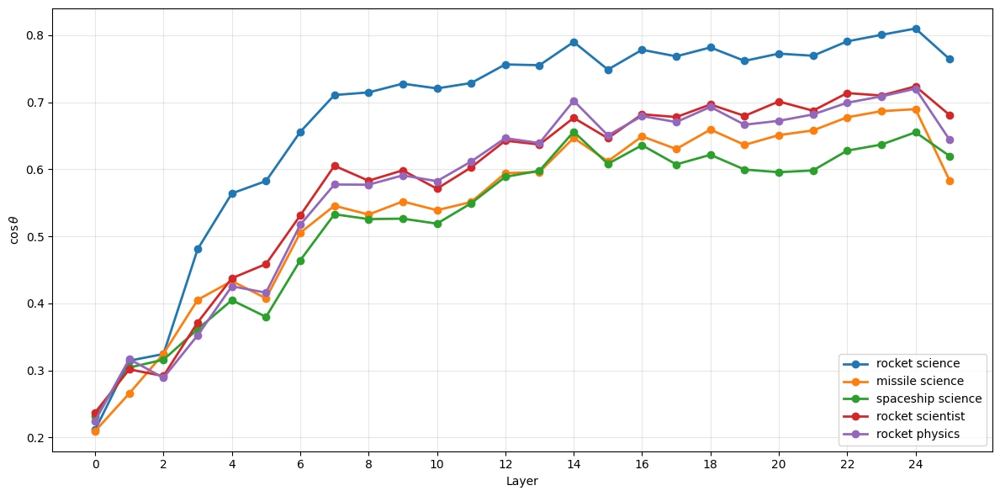

In [84]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["It's not rocket science", "It's not missile science", "It's not spaceship science", "It's not rocket scientist", "It's not rocket physics"],
                                     target_sentence=target_text,
                                     min_token_pos=min_token_pos)

In [82]:
max_layer = 4
corrupted_texts = ["It's not missile science", "It's not spaceship science", "It's not rocket scientist", "It's not rocket physics"]

Threshold Sweep: 100%|██████████| 40/40 [02:15<00:00,  3.38s/it]


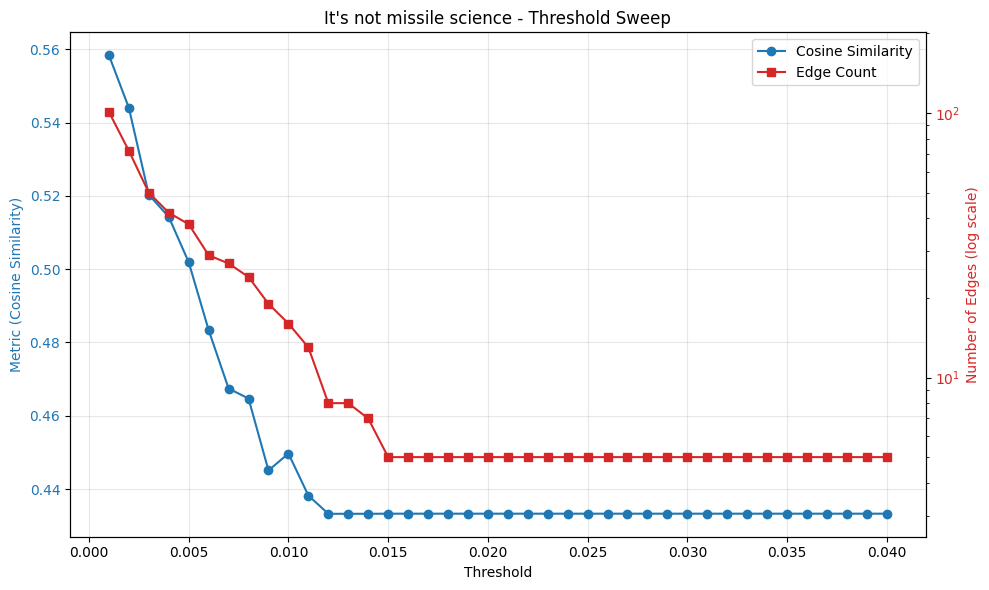

Threshold Sweep: 100%|██████████| 40/40 [02:23<00:00,  3.59s/it]


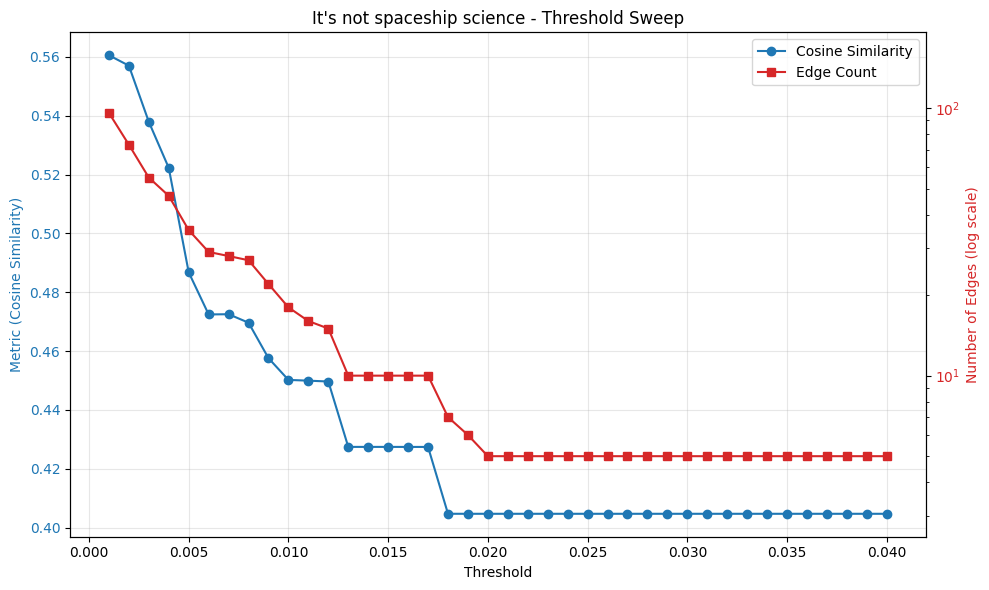

Threshold Sweep: 100%|██████████| 40/40 [01:40<00:00,  2.50s/it]


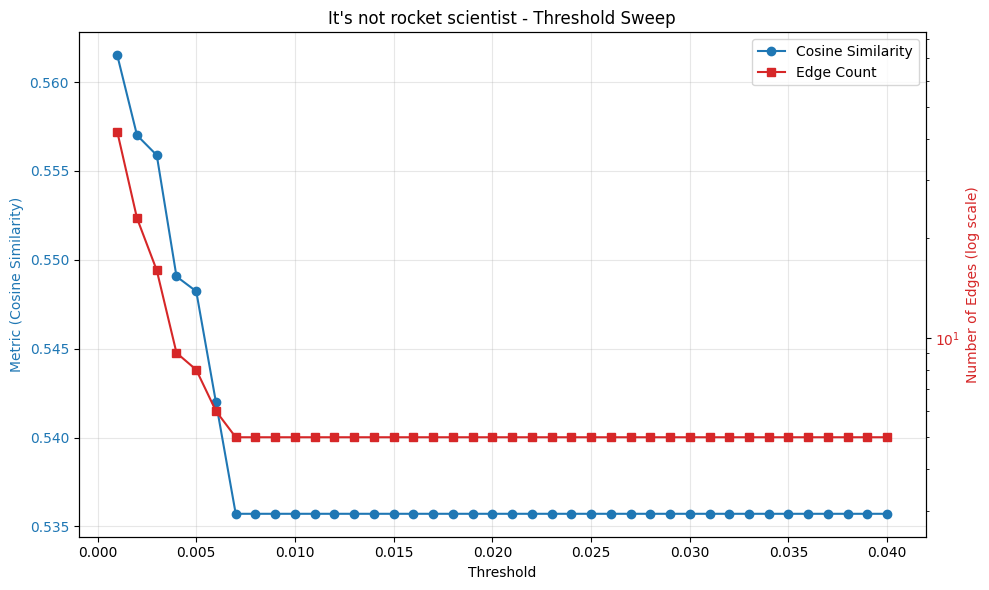

Threshold Sweep: 100%|██████████| 40/40 [01:54<00:00,  2.85s/it]


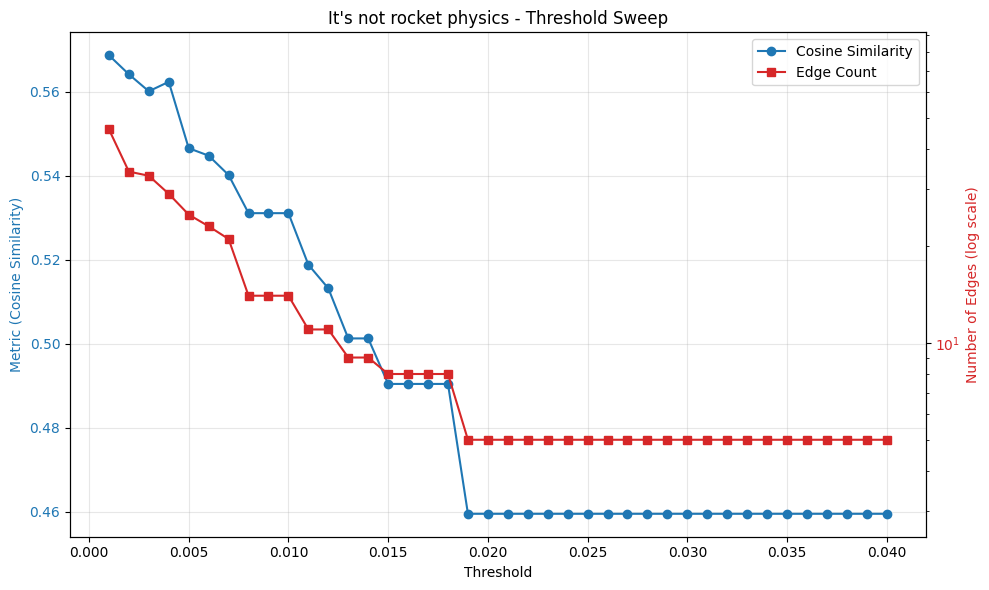

In [45]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.04, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

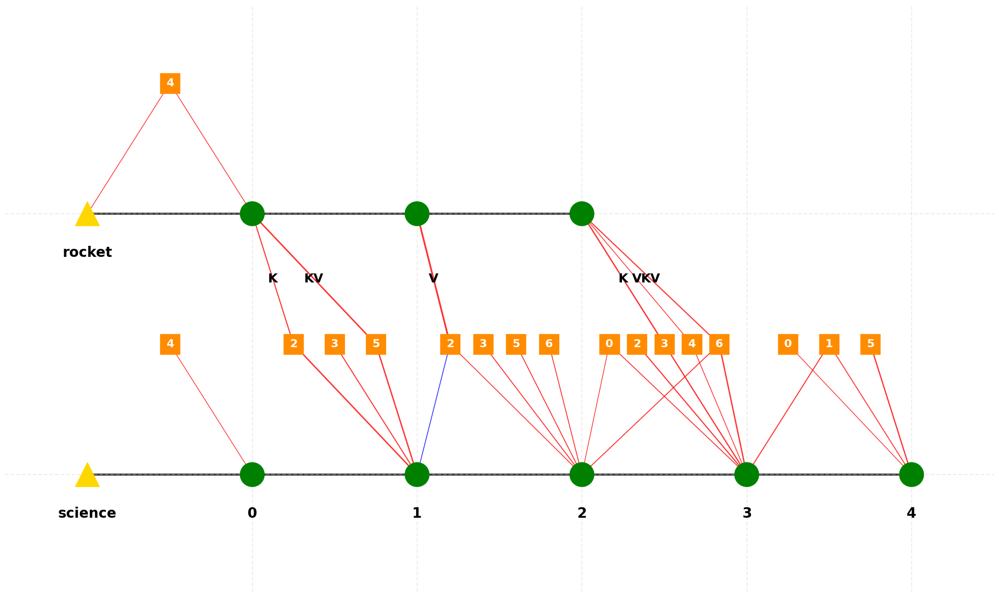

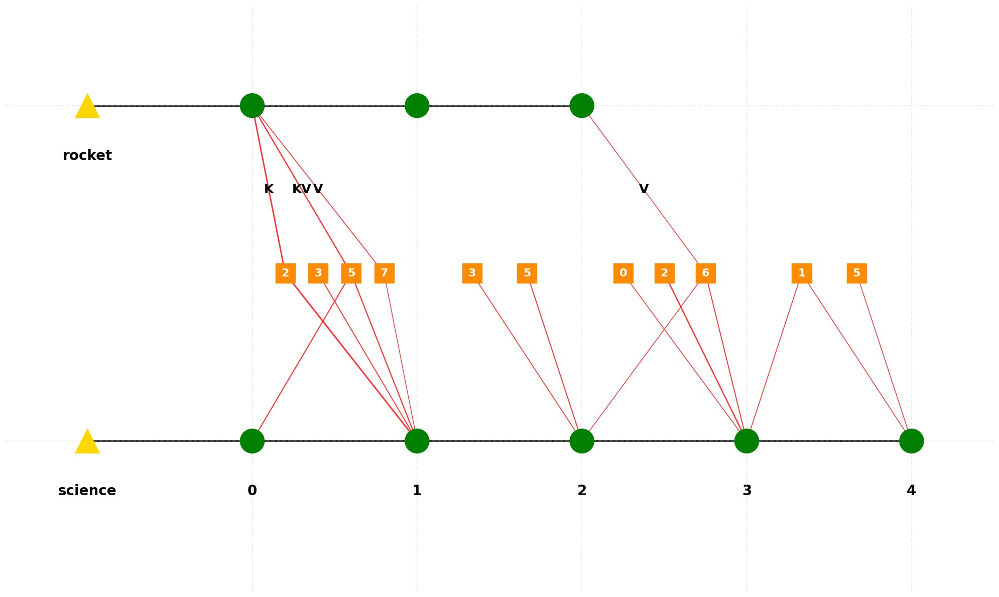

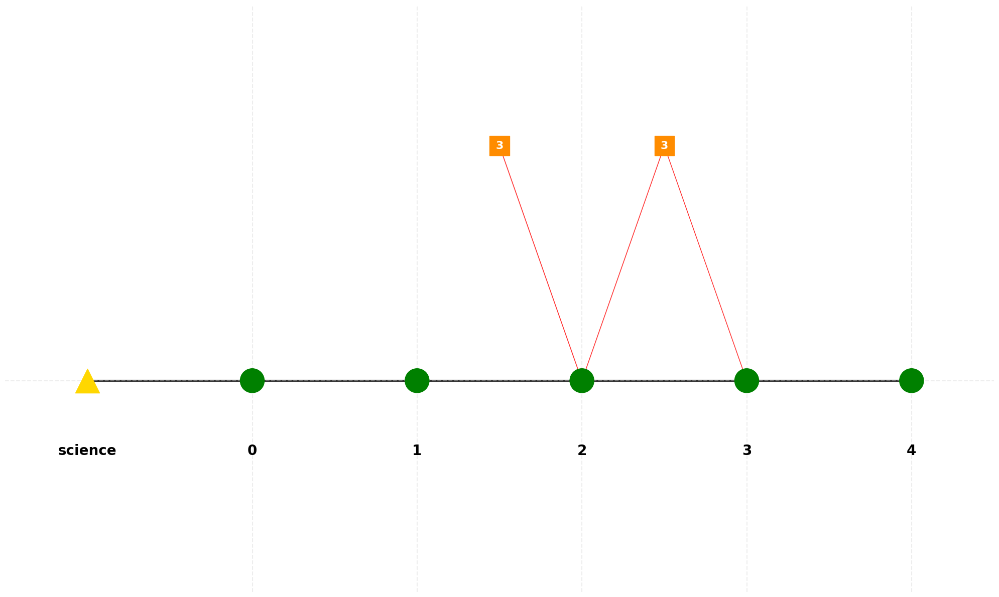

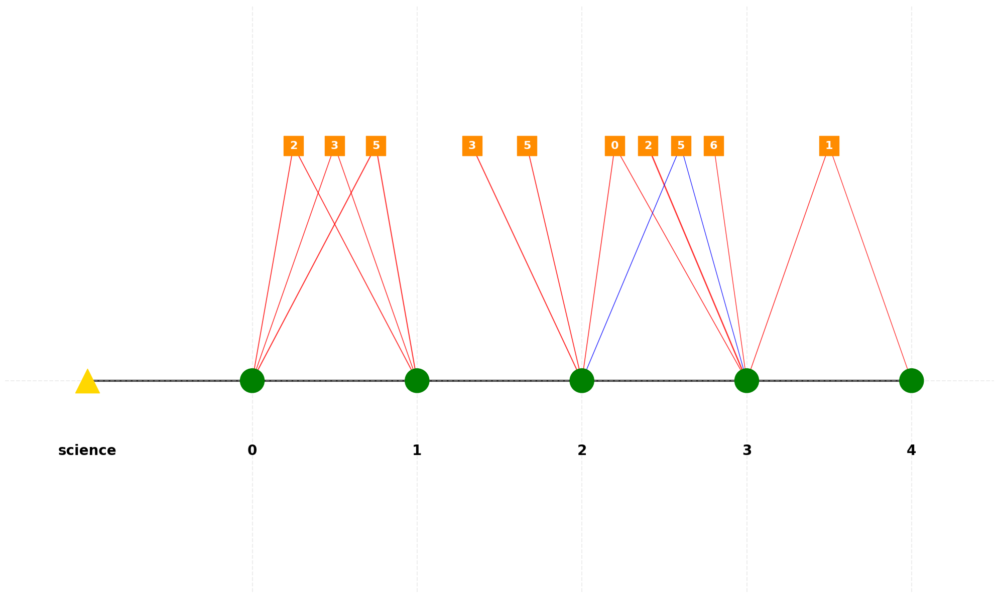

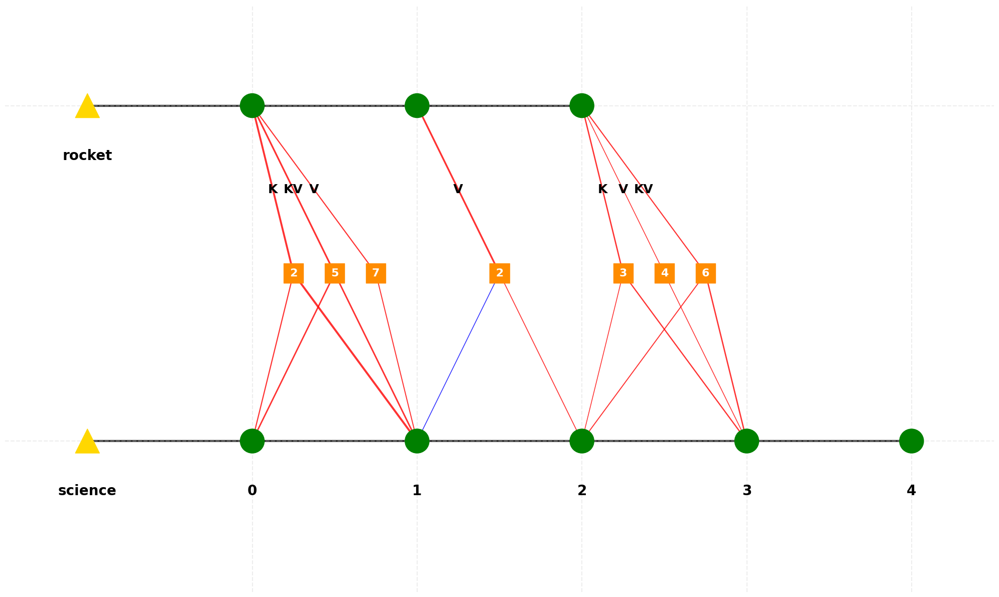


Circuit Summary:
Nodes: 17
Edges: 29

Attention Output Edges by effect size:
  L1H2_T6 → L1_T6 (attn_out): 0.0286
  L1H5_T6 → L1_T6 (attn_out): 0.0178
  L3H6_T6 → L3_T6 (attn_out): 0.0144
  L3H3_T6 → L3_T6 (attn_out): 0.0126
  L1H7_T6 → L1_T6 (attn_out): 0.0090
  L2H2_T6 → L2_T6 (attn_out): 0.0069
  L3H4_T6 → L3_T6 (attn_out): 0.0061

Query/Key/Value Edges by effect size:
  L0_T5 → L1H2_T6 (key): 0.0258
  L1_T5 → L2H2_T6 (value): 0.0222
  L0_T5 → L1H5_T6 (key): 0.0210
  L0_T6 → L1H5_T6 (query): 0.0164
  L2_T5 → L3H3_T6 (key): 0.0144
  L0_T6 → L1H2_T6 (query): 0.0112
  L0_T5 → L1H7_T6 (value): 0.0110
  L2_T5 → L3H6_T6 (value): 0.0109
  L2_T6 → L3H6_T6 (query): 0.0089
  L0_T5 → L1H5_T6 (value): 0.0085
  L2_T5 → L3H6_T6 (key): 0.0074
  L1_T6 → L2H2_T6 (query): -0.0063
  L2_T6 → L3H3_T6 (query): 0.0062
  L2_T5 → L3H4_T6 (value): 0.0060


In [83]:
thresholds = [0.005, 0.008, 0.005, 0.007]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,  # Individual thresholds for each
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

# Missed the Boat

In [116]:
original_text = "You missed the boat"
min_token_pos = 2
target_text="You missed the opportunity"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' missed', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' boat', top_k=50)

Original text tokens: ['<bos>', 'You', ' missed', ' the', ' boat']
Token at position 2: ' missed'
Target token: ' missed' (ID: 13826)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' missed':
------------------------------------------------------------
 1. Token ID  13826: ' missed' (similarity: 1.0000)
 2. Token ID 155881: ' Missed' (similarity: 0.7857)
 3. Token ID  28257: 'missed' (similarity: 0.7803)
 4. Token ID 134930: 'Missed' (similarity: 0.7184)
 5. Token ID  71944: ' misses' (similarity: 0.6785)
 6. Token ID   5190: ' miss' (similarity: 0.6143)
 7. Token ID  31393: ' MISS' (similarity: 0.5554)
 8. Token ID   9373: 'miss' (similarity: 0.5260)
 9. Token ID   9858: ' missing' (similarity: 0.5121)
10. Token ID  23320: 'MISS' (similarity: 0.4840)
11. Token ID  39976: 'missing' (similarity: 0.4662)
12. Token ID  51048: ' Missing' (similarity: 0.4649)
13. Token ID  35021: 'Missing' (similarity: 0.4509)
14.

Analyzing similarities to target sentence: 'You missed the opportunity'
Comparing 5 sentences across layers...


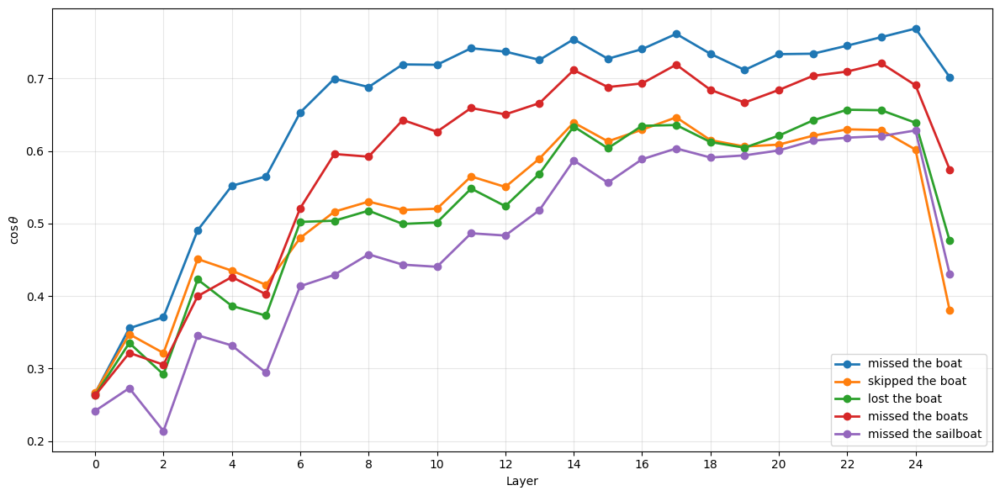

In [27]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["You missed the boat", "You skipped the boat", "You lost the boat", "You missed the boats", "You missed the sailboat"],
                                     target_sentence=target_text,
                                     min_token_pos=min_token_pos)

In [117]:
max_layer = 4
corrupted_texts = ["You skipped the boat", "You lost the boat", "You missed the boats", "You missed the sailboat"]

Threshold Sweep: 100%|██████████| 20/20 [01:49<00:00,  5.50s/it]


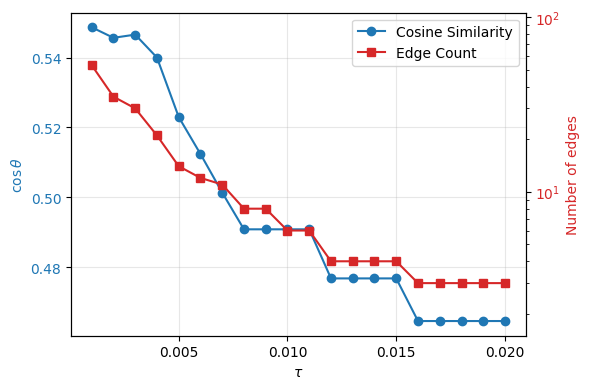

Threshold Sweep: 100%|██████████| 20/20 [01:55<00:00,  5.80s/it]


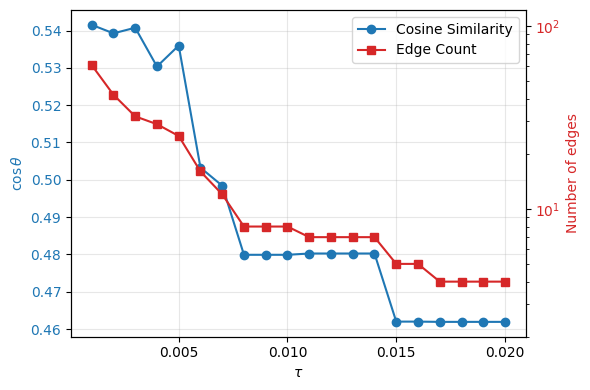

Threshold Sweep: 100%|██████████| 20/20 [01:04<00:00,  3.22s/it]


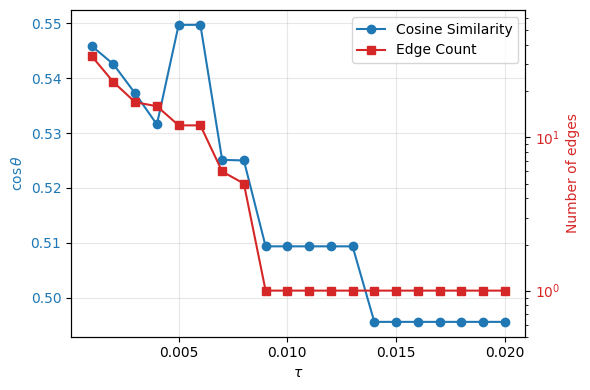

Threshold Sweep: 100%|██████████| 20/20 [01:35<00:00,  4.75s/it]


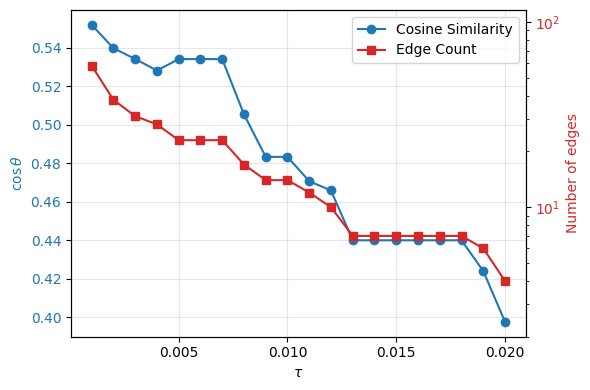

In [29]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.02, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

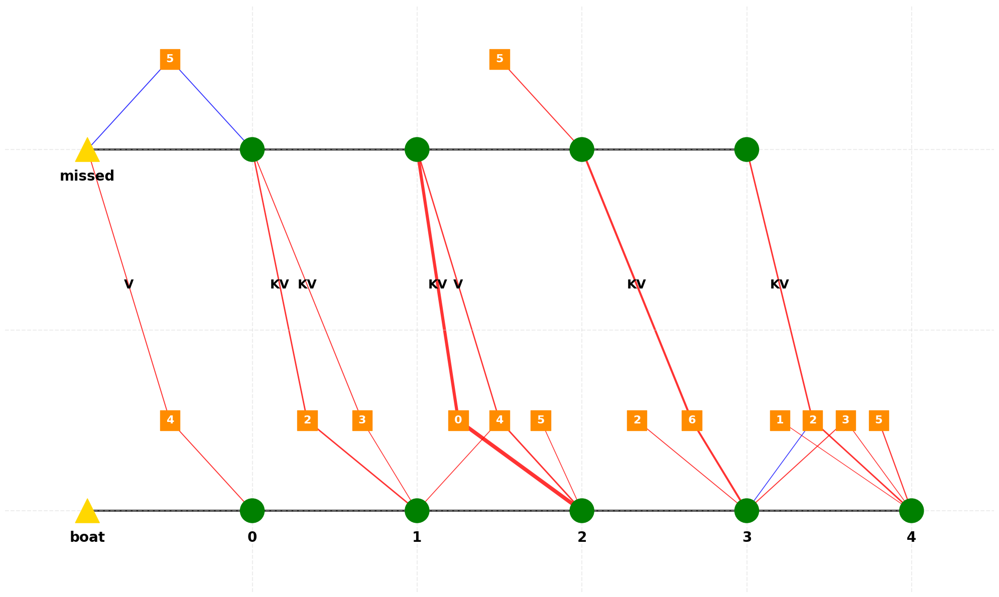

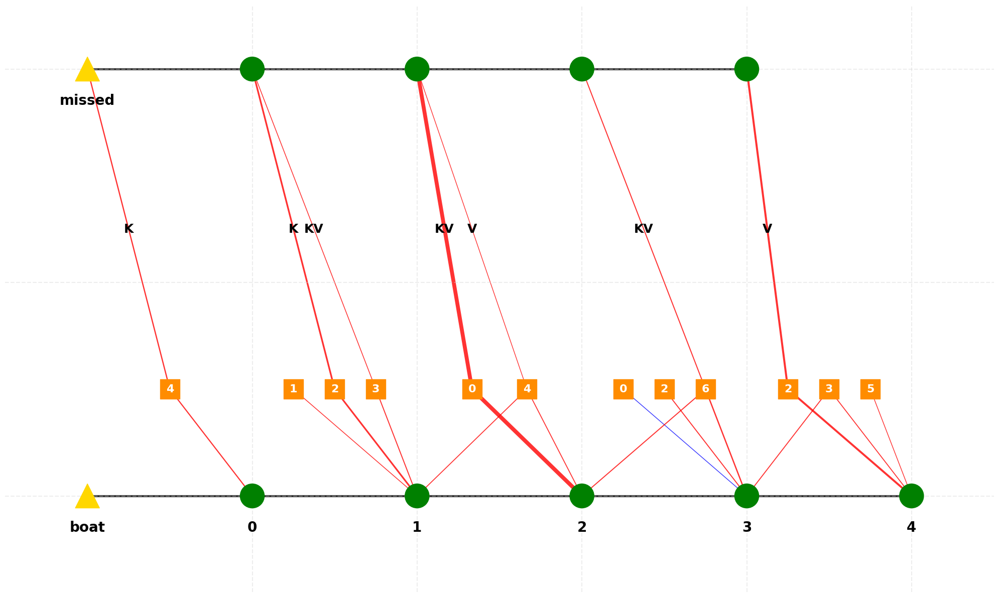

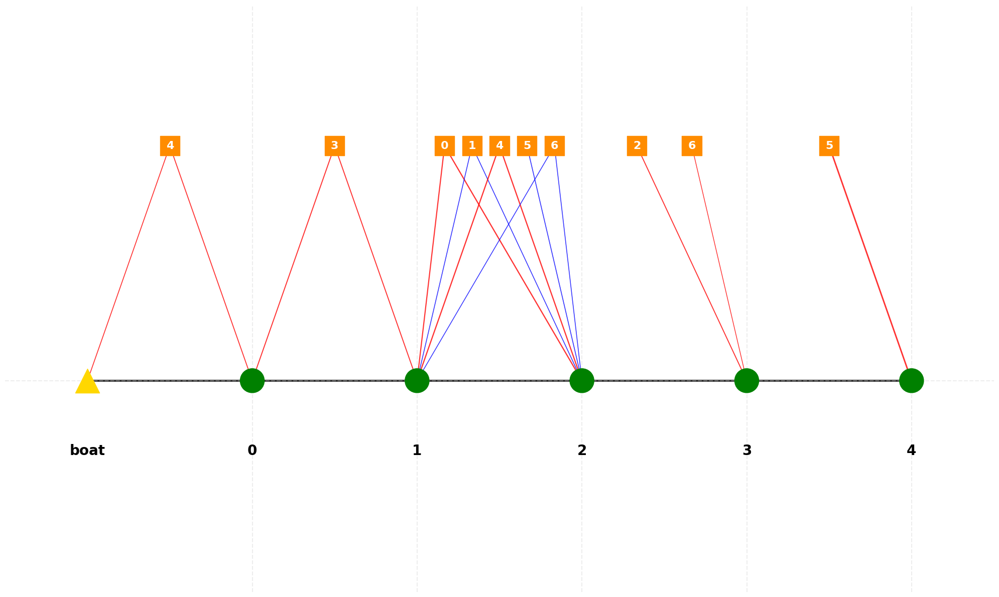

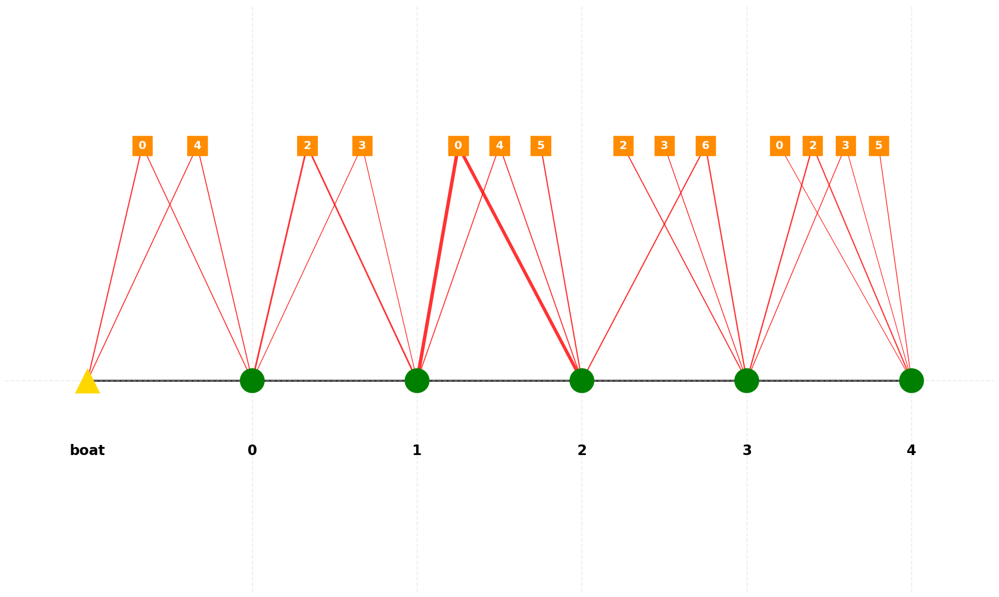

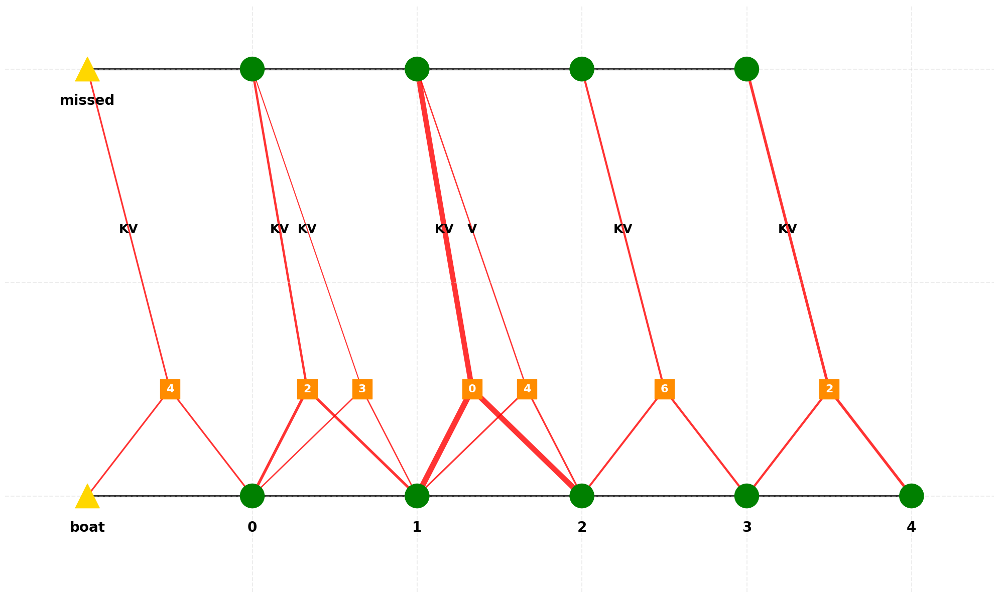


Circuit Summary:
Nodes: 18
Edges: 36

Attention Output Edges by effect size:
  L2H0_T4 → L2_T4 (attn_out): 0.0910
  L4H2_T4 → L4_T4 (attn_out): 0.0280
  L1H2_T4 → L1_T4 (attn_out): 0.0271
  L3H6_T4 → L3_T4 (attn_out): 0.0190
  L2H4_T4 → L2_T4 (attn_out): 0.0134
  L0H4_T4 → L0_T4 (attn_out): 0.0126
  L1H3_T4 → L1_T4 (attn_out): 0.0088

Query/Key/Value Edges by effect size:
  L1_T4 → L2H0_T4 (query): 0.1007
  L1_T2 → L2H0_T4 (key): 0.0878
  L0_T4 → L1H2_T4 (query): 0.0297
  L3_T2 → L4H2_T4 (value): 0.0289
  L0_T2 → L1H2_T4 (key): 0.0217
  L3_T4 → L4H2_T4 (query): 0.0198
  L2_T2 → L3H6_T4 (value): 0.0179
  L2_T4 → L3H6_T4 (query): 0.0170
  Embed_T2 → L0H4_T4 (key): 0.0129
  Embed_T4 → L0H4_T4 (query): 0.0124
  L1_T4 → L2H4_T4 (query): 0.0123
  L0_T4 → L1H3_T4 (query): 0.0092
  L1_T2 → L2H4_T4 (value): 0.0085
  L2_T2 → L3H6_T4 (key): 0.0063
  L3_T2 → L4H2_T4 (key): 0.0061
  L0_T2 → L1H3_T4 (value): 0.0059
  L1_T2 → L2H0_T4 (value): 0.0053
  Embed_T2 → L0H4_T4 (value): 0.0052
  L0_T2 → L1H

In [30]:
thresholds = [0.003, 0.005, 0.004, 0.007]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,  # Individual thresholds for each
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

In [118]:
all_texts = [original_text] + corrupted_texts
dot_products = simple_acdc.compute_qk_dot_products(
    model=model,
    texts=all_texts,
    layer=2,
    head_idx=0,
    q_index=4,
    k_index=2  
)
print(sum(dot_products[1:3])/2)
print(sum(dot_products[3:5])/2)

Computing Q-K dot products for Layer 2, Head 0 (Q@4, K@2):
Q token at position 4: ' boat'
K token at position 2: ' missed'
--------------------------------------------------------------------------------
'You missed the boat' -> 95.874451
'You skipped the boat' -> 40.638672
'You lost the boat' -> 17.373951
'You missed the boats' -> 52.602840
'You missed the sailboat' -> 8.219725
--------------------------------------------------------------------------------
29.006311416625977
30.411282539367676


# Pulling your Leg

In [49]:
original_text = "I'm pulling your leg"
min_token_pos = 4
target_text="I'm kidding you"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' pulling', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' leg', top_k=50)

Original text tokens: ['<bos>', 'I', "'", 'm', ' pulling', ' your', ' leg']
Token at position 4: ' pulling'
Target token: ' pulling' (ID: 28024)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' pulling':
------------------------------------------------------------
 1. Token ID  28024: ' pulling' (similarity: 1.0000)
 2. Token ID  44377: ' pulls' (similarity: 0.8119)
 3. Token ID 209205: ' Pulling' (similarity: 0.8089)
 4. Token ID   7825: ' pull' (similarity: 0.7842)
 5. Token ID  16487: ' pulled' (similarity: 0.7841)
 6. Token ID  23801: 'pull' (similarity: 0.7735)
 7. Token ID 233209: 'Pulling' (similarity: 0.7627)
 8. Token ID  34474: ' Pull' (similarity: 0.7427)
 9. Token ID 193948: ' PULL' (similarity: 0.7215)
10. Token ID  37176: 'Pull' (similarity: 0.7112)
11. Token ID 229983: 'pulled' (similarity: 0.6804)
12. Token ID 230588: ' Pulled' (similarity: 0.6455)
13. Token ID 147590: 'PULL' (similarity: 0.60

Analyzing similarities to target sentence: 'I'm kidding you'
Comparing 5 sentences across layers...


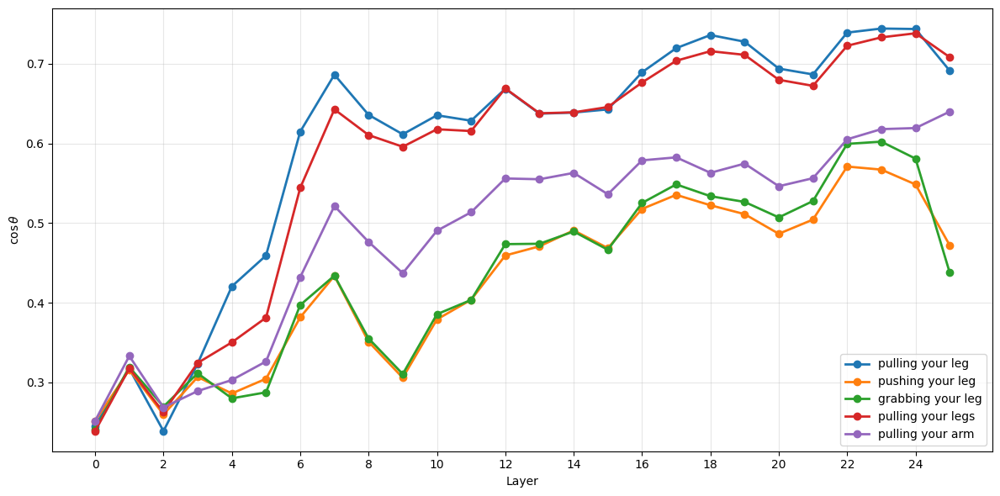

In [50]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["I'm pulling your leg", "I'm pushing your leg", "I'm grabbing your leg", "I'm pulling your legs", "I'm pulling your arm"],
                                     target_sentence=target_text,
                                     min_token_pos=min_token_pos)

In [51]:
max_layer = 4
corrupted_texts = ["I'm pushing your leg", "I'm grabbing your leg", "I'm pulling your legs", "I'm pulling your arm"]

Threshold Sweep: 100%|██████████| 20/20 [02:00<00:00,  6.04s/it]


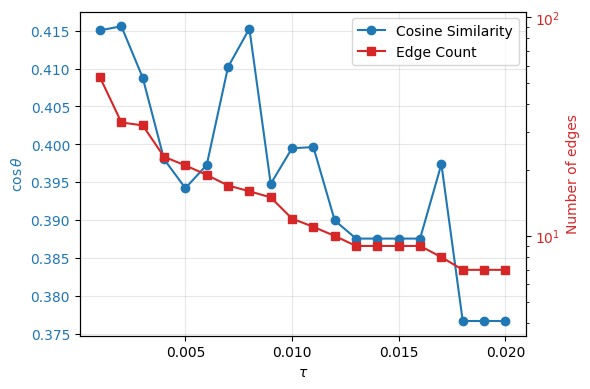

Threshold Sweep: 100%|██████████| 20/20 [01:53<00:00,  5.65s/it]


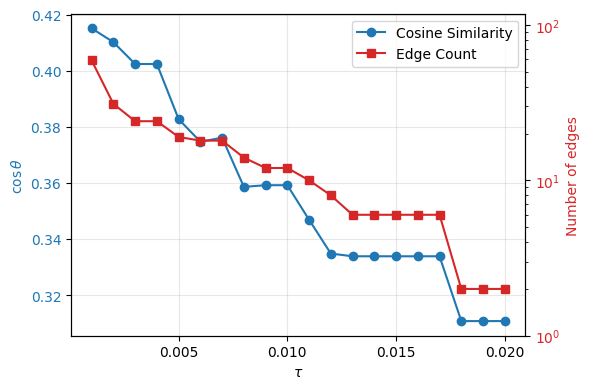

Threshold Sweep: 100%|██████████| 20/20 [01:04<00:00,  3.25s/it]


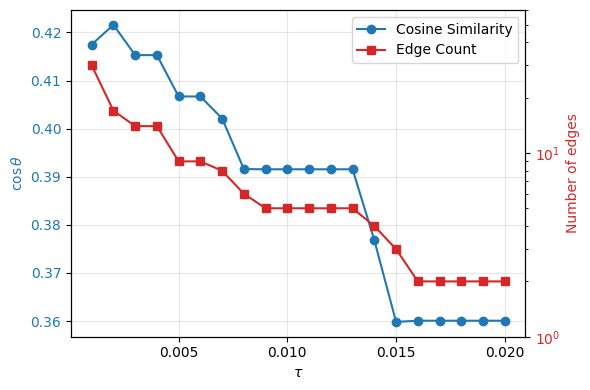

Threshold Sweep: 100%|██████████| 20/20 [01:24<00:00,  4.21s/it]


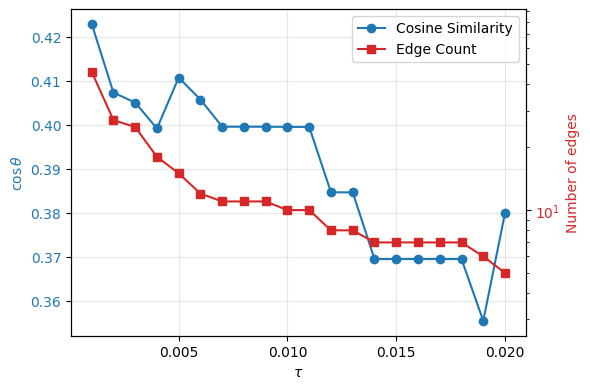

In [52]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.02, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

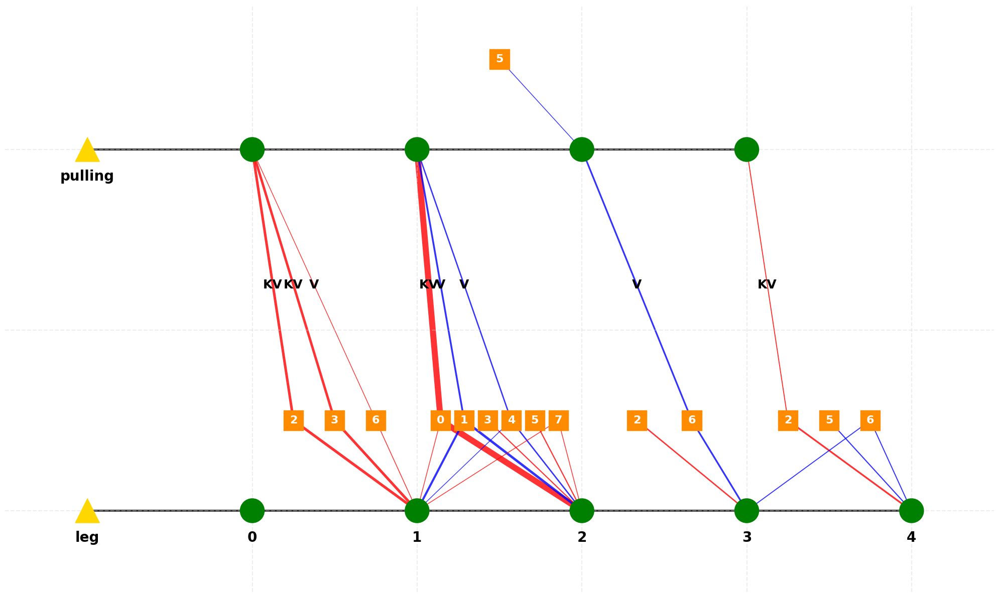

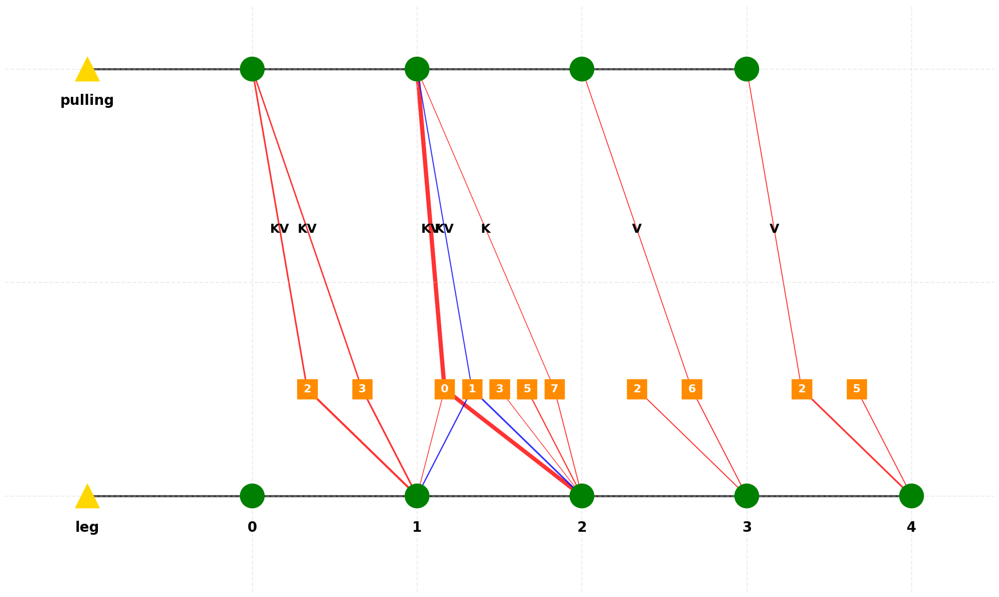

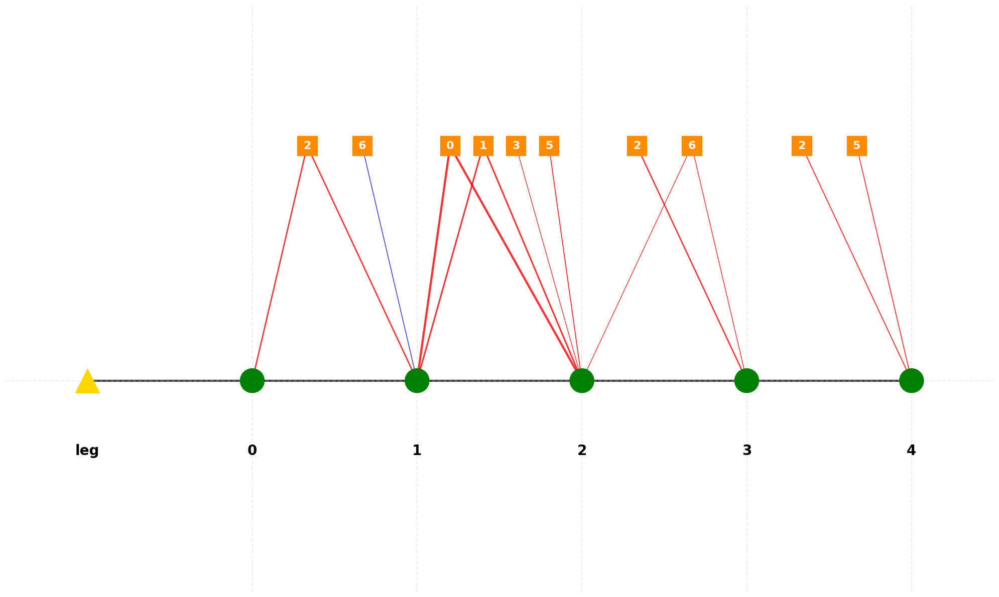

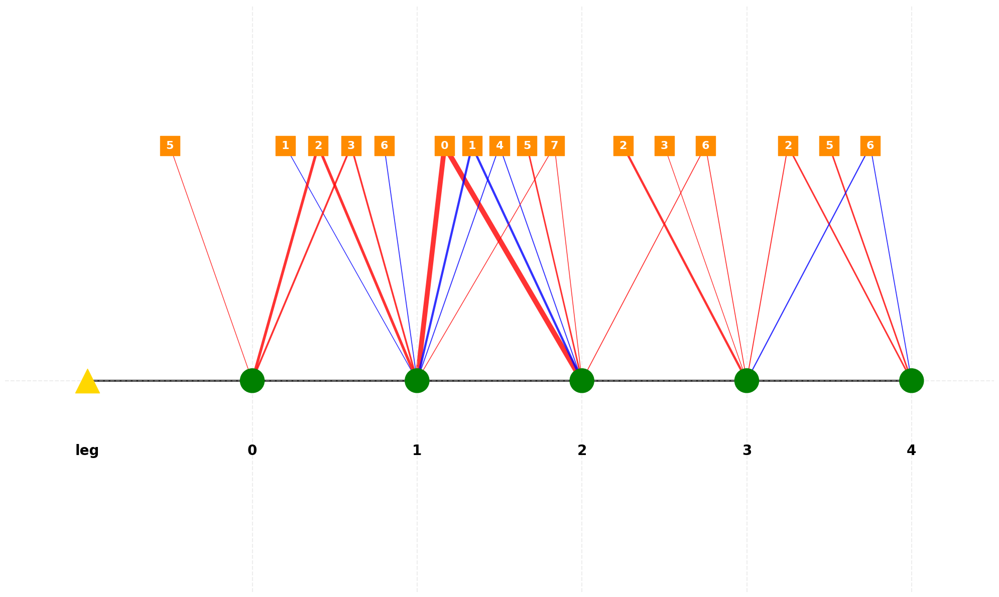

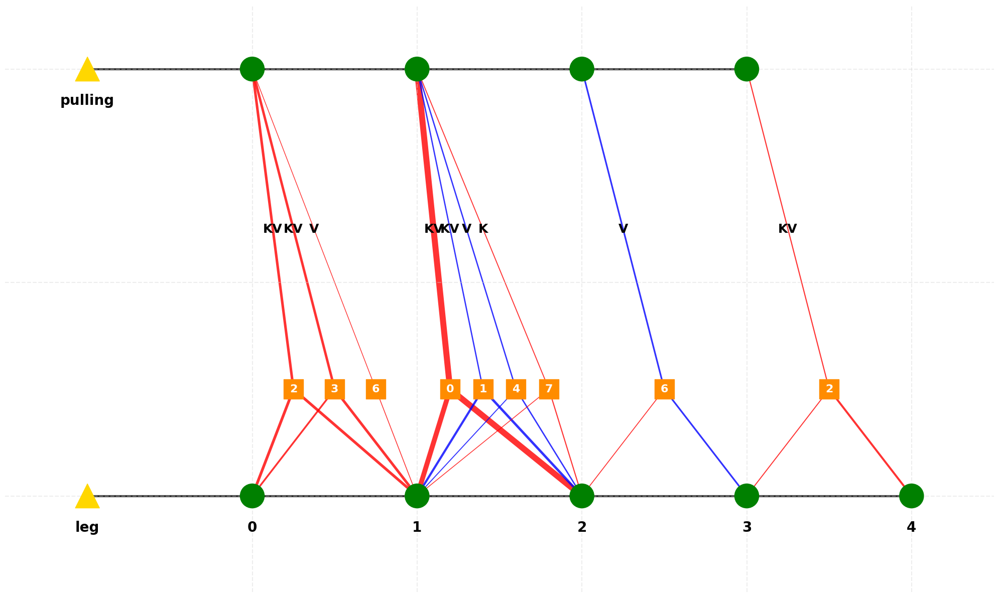


Circuit Summary:
Nodes: 20
Edges: 40

Attention Output Edges by effect size:
  L2H0_T6 → L2_T6 (attn_out): 0.1083
  L1H2_T6 → L1_T6 (attn_out): 0.0286
  L1H3_T6 → L1_T6 (attn_out): 0.0266
  L2H1_T6 → L2_T6 (attn_out): -0.0235
  L4H2_T6 → L4_T6 (attn_out): 0.0174
  L3H6_T6 → L3_T6 (attn_out): -0.0129
  L2H4_T6 → L2_T6 (attn_out): -0.0092
  L2H7_T6 → L2_T6 (attn_out): 0.0063
  L1H6_T6 → L1_T6 (attn_out): 0.0036

Query/Key/Value Edges by effect size:
  L1_T4 → L2H0_T6 (key): 0.1085
  L1_T6 → L2H0_T6 (query): 0.0769
  L0_T6 → L1H2_T6 (query): 0.0293
  L0_T4 → L1H2_T6 (key): 0.0263
  L0_T4 → L1H3_T6 (key): 0.0244
  L1_T6 → L2H1_T6 (query): -0.0197
  L1_T4 → L2H0_T6 (value): 0.0161
  L0_T6 → L1H3_T6 (query): 0.0143
  L1_T4 → L2H1_T6 (value): -0.0142
  L0_T4 → L1H3_T6 (value): 0.0129
  L2_T4 → L3H6_T6 (value): -0.0125
  L0_T4 → L1H2_T6 (value): 0.0104
  L1_T4 → L2H4_T6 (value): -0.0086
  L1_T4 → L2H1_T6 (key): -0.0084
  L3_T4 → L4H2_T6 (value): 0.0064
  L3_T6 → L4H2_T6 (query): 0.0053
  L1_T

In [53]:
thresholds = [0.003, 0.004, 0.004, 0.003]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,  # Individual thresholds for each
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

# Under the Weather

In [55]:
original_text = "She is under the weather"
min_token_pos = 3
target_text="She is feeling ill"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' under', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' weather', top_k=50)

Original text tokens: ['<bos>', 'She', ' is', ' under', ' the', ' weather']
Token at position 3: ' under'
Target token: ' under' (ID: 1362)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' under':
------------------------------------------------------------
 1. Token ID   1362: ' under' (similarity: 1.0000)
 2. Token ID   5323: 'under' (similarity: 0.7711)
 3. Token ID   7457: ' Under' (similarity: 0.7527)
 4. Token ID  12373: 'Under' (similarity: 0.7096)
 5. Token ID  42715: ' UNDER' (similarity: 0.6588)
 6. Token ID   8411: ' unter' (similarity: 0.5804)
 7. Token ID  15317: ' onder' (similarity: 0.5103)
 8. Token ID  20719: ' bajo' (similarity: 0.5069)
 9. Token ID   6079: ' под' (similarity: 0.4698)
10. Token ID  13052: ' sous' (similarity: 0.4680)
11. Token ID  67392: 'UNDER' (similarity: 0.4667)
12. Token ID    575: ' in' (similarity: 0.4522)
13. Token ID  29329: ' sotto' (similarity: 0.4486)
14. Token I

Analyzing similarities to target sentence: 'She is feeling ill'
Comparing 5 sentences across layers...


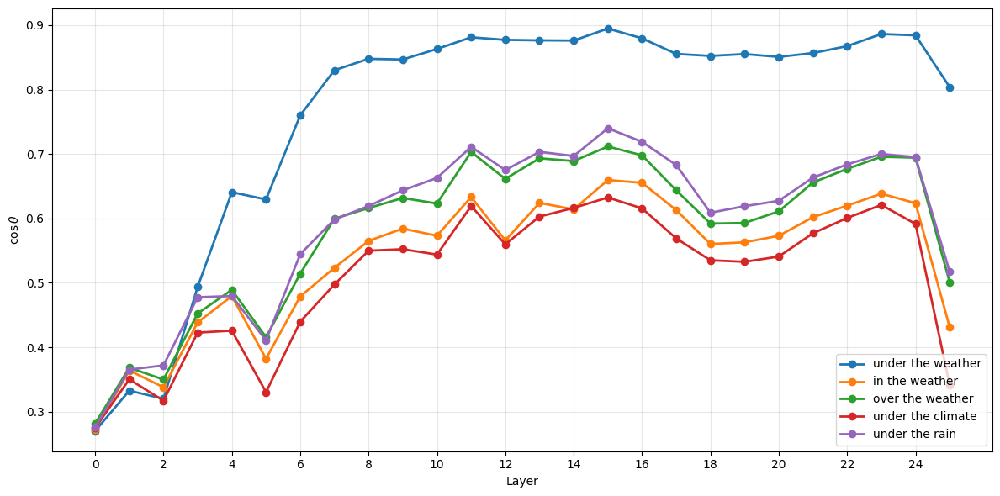

In [56]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["She is under the weather", "She is in the weather", "She is over the weather", "She is under the climate", "She is under the rain"],
                                     target_sentence=target_text,
                                     min_token_pos=min_token_pos)

In [57]:
max_layer = 5
corrupted_texts = ["She is in the weather", "She is over the weather", "She is under the climate", "She is under the rain"]

Threshold Sweep: 100%|██████████| 20/20 [02:37<00:00,  7.88s/it]


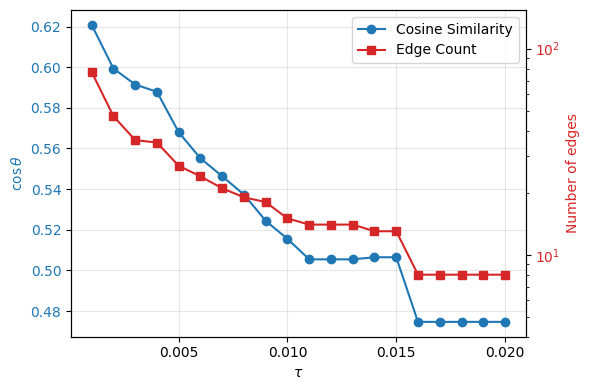

Threshold Sweep: 100%|██████████| 20/20 [18:51<00:00, 56.59s/it] 


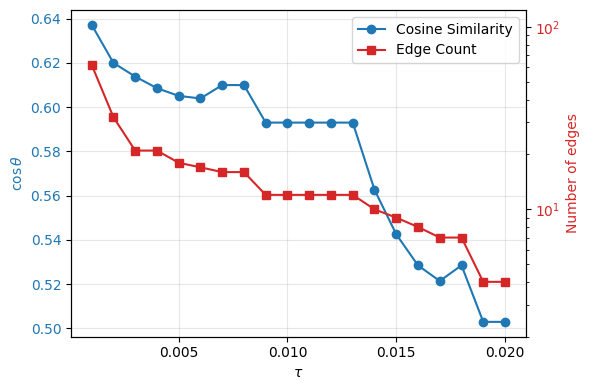

Threshold Sweep: 100%|██████████| 20/20 [22:12<00:00, 66.63s/it]  


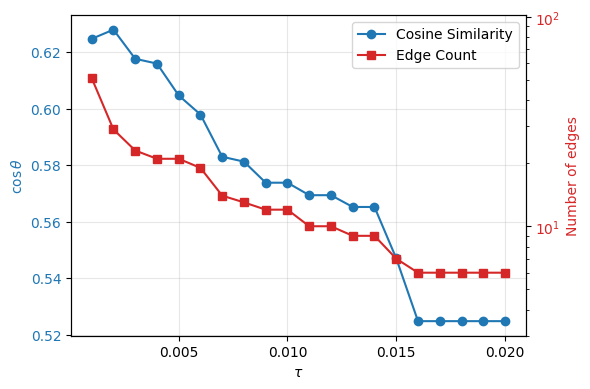

Threshold Sweep: 100%|██████████| 20/20 [01:42<00:00,  5.15s/it]


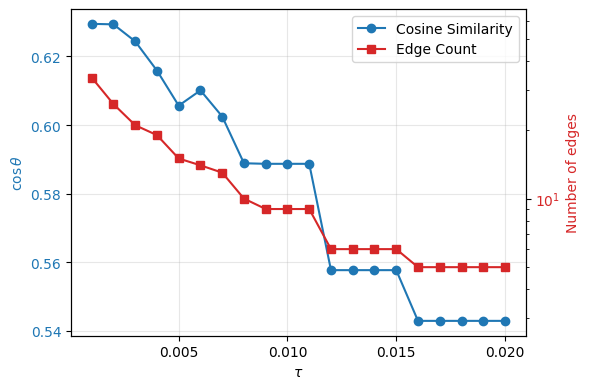

In [58]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.02, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

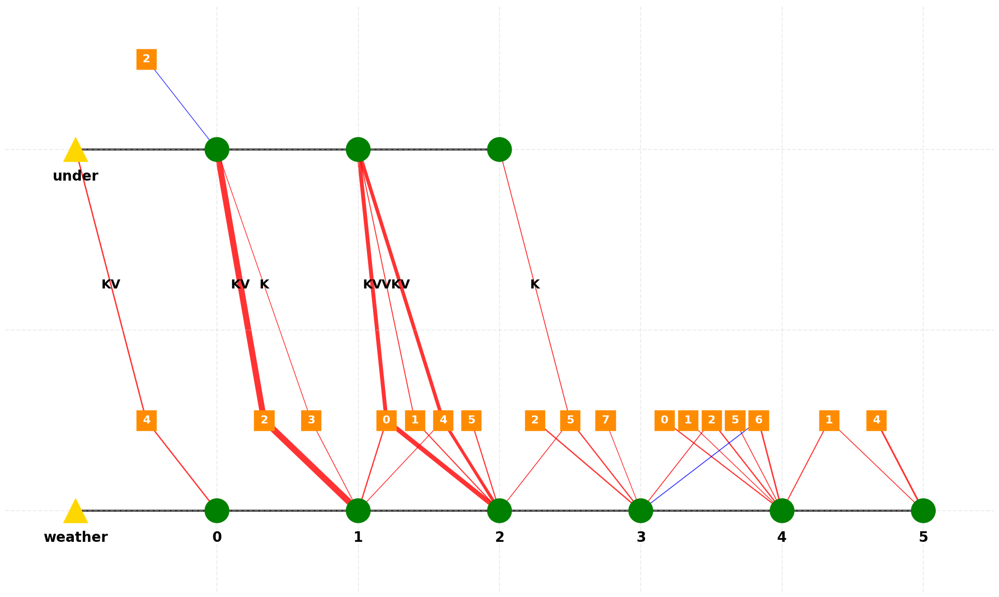

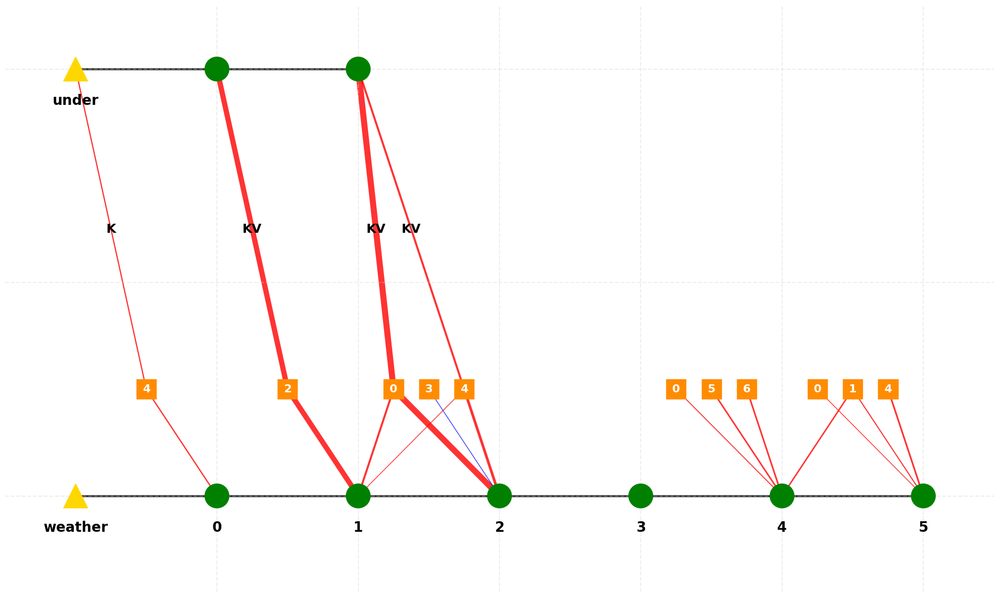

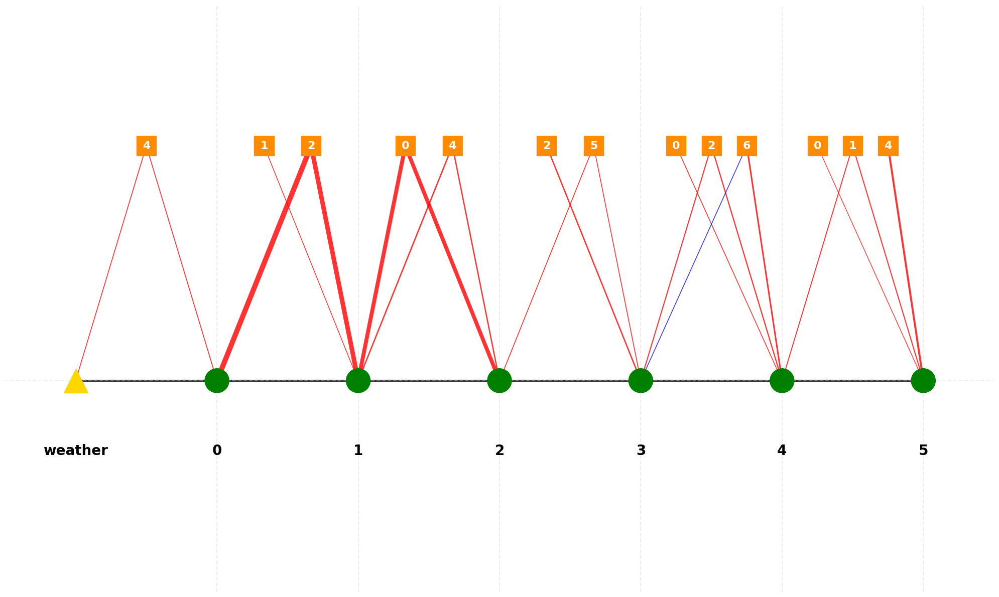

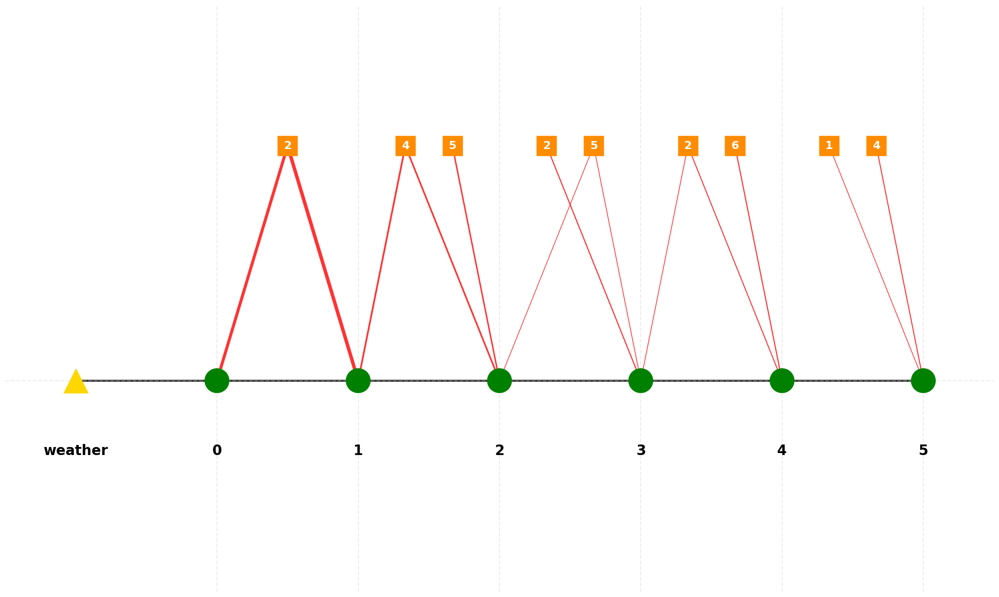

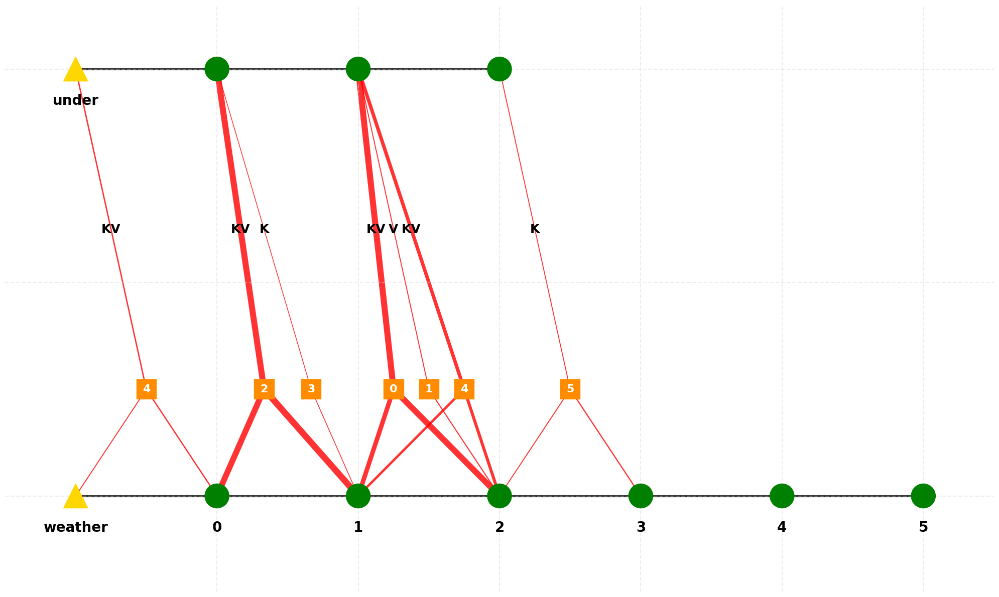


Circuit Summary:
Nodes: 18
Edges: 32

Attention Output Edges by effect size:
  L1H2_T5 → L1_T5 (attn_out): 0.1575
  L2H0_T5 → L2_T5 (attn_out): 0.1434
  L2H4_T5 → L2_T5 (attn_out): 0.0463
  L0H4_T5 → L0_T5 (attn_out): 0.0112
  L3H5_T5 → L3_T5 (attn_out): 0.0100
  L2H1_T5 → L2_T5 (attn_out): 0.0085
  L1H3_T5 → L1_T5 (attn_out): 0.0051

Query/Key/Value Edges by effect size:
  L1_T3 → L2H0_T5 (key): 0.1465
  L0_T3 → L1H2_T5 (key): 0.1453
  L0_T5 → L1H2_T5 (query): 0.1389
  L1_T5 → L2H0_T5 (query): 0.0899
  L1_T3 → L2H0_T5 (value): 0.0705
  L0_T3 → L1H2_T5 (value): 0.0659
  L1_T3 → L2H4_T5 (value): 0.0595
  L1_T3 → L2H4_T5 (key): 0.0463
  L1_T5 → L2H4_T5 (query): 0.0317
  Embed_T3 → L0H4_T5 (value): 0.0120
  Embed_T3 → L0H4_T5 (key): 0.0100
  Embed_T5 → L0H4_T5 (query): 0.0071
  L2_T5 → L3H5_T5 (query): 0.0070
  L1_T3 → L2H1_T5 (value): 0.0069
  L2_T3 → L3H5_T5 (key): 0.0061
  L0_T3 → L1H3_T5 (key): 0.0045


In [59]:
thresholds = [0.004, 0.004, 0.005, 0.007]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,  # Individual thresholds for each
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

# Faced the Music

In [120]:
original_text = "He faced the music"
min_token_pos = 2
target_text="He faced the consequences"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' faced', top_k=80)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' music', top_k=50)

Original text tokens: ['<bos>', 'He', ' faced', ' the', ' music']
Token at position 2: ' faced'
Target token: ' faced' (ID: 20360)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 80 tokens most similar to ' faced':
------------------------------------------------------------
 1. Token ID  20360: ' faced' (similarity: 1.0000)
 2. Token ID  46223: 'faced' (similarity: 0.7197)
 3. Token ID 176303: ' Faced' (similarity: 0.6913)
 4. Token ID  15853: ' facing' (similarity: 0.6609)
 5. Token ID  14580: ' faces' (similarity: 0.6095)
 6. Token ID   3142: ' face' (similarity: 0.6078)
 7. Token ID  58832: ' confronted' (similarity: 0.5709)
 8. Token ID   2106: 'face' (similarity: 0.5540)
 9. Token ID  20930: ' Face' (similarity: 0.5447)
10. Token ID 117153: ' Facing' (similarity: 0.5419)
11. Token ID  21929: 'Face' (similarity: 0.5415)
12. Token ID 102755: 'Facing' (similarity: 0.5234)
13. Token ID  63965: ' FACE' (similarity: 0.5106)
14. Token I

Analyzing similarities to target sentence: 'He faced the consequences'
Comparing 5 sentences across layers...


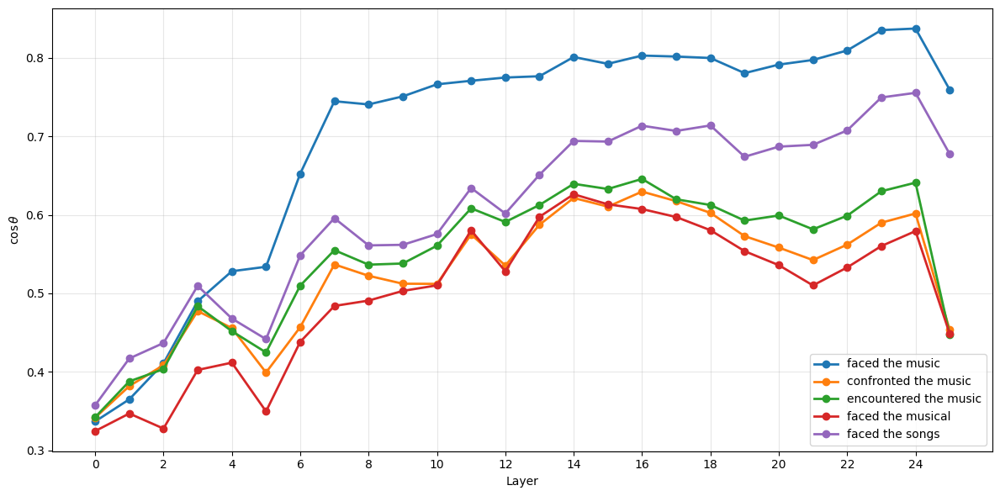

In [71]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["He faced the music", "He confronted the music", "He encountered the music", "He faced the musical", "He faced the songs"],
                                     target_sentence=target_text,
                                     min_token_pos=min_token_pos)

In [121]:
max_layer = 5
corrupted_texts = ["He confronted the music", "He encountered the music", "He faced the musical", "He faced the songs"]

Threshold Sweep: 100%|██████████| 20/20 [02:31<00:00,  7.59s/it]


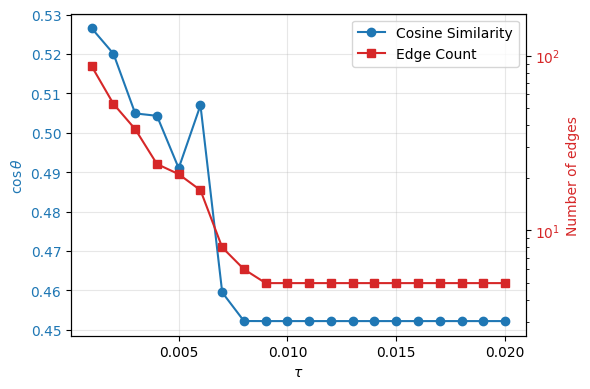

Threshold Sweep: 100%|██████████| 20/20 [02:50<00:00,  8.53s/it]


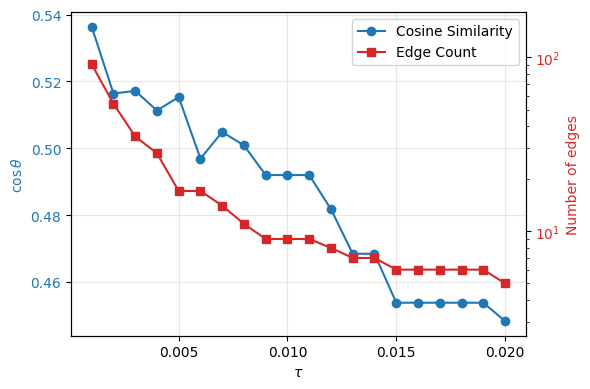

Threshold Sweep: 100%|██████████| 20/20 [01:55<00:00,  5.79s/it]


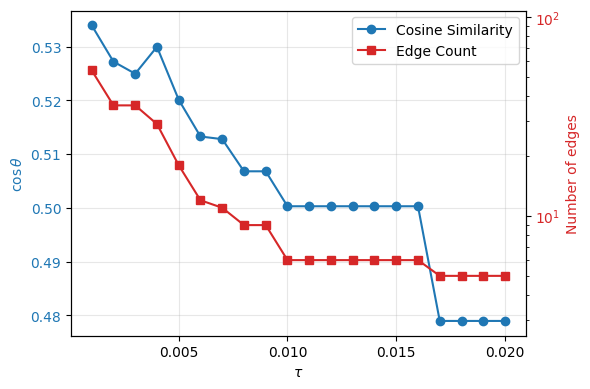

Threshold Sweep: 100%|██████████| 20/20 [01:53<00:00,  5.68s/it]


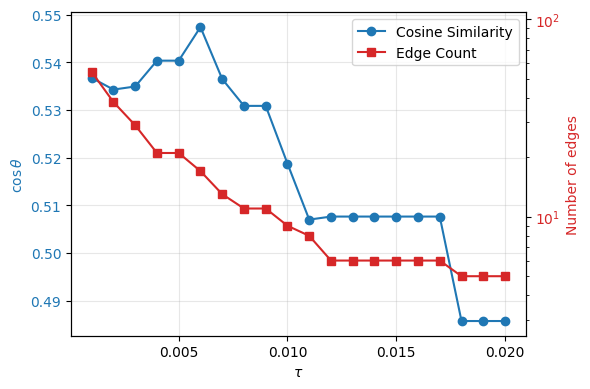

In [73]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.02, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

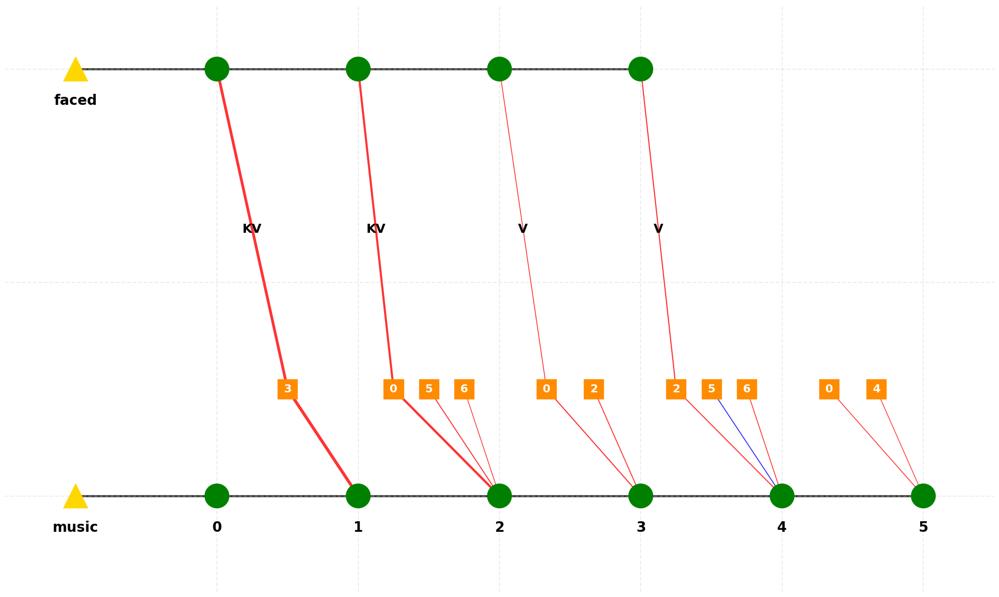

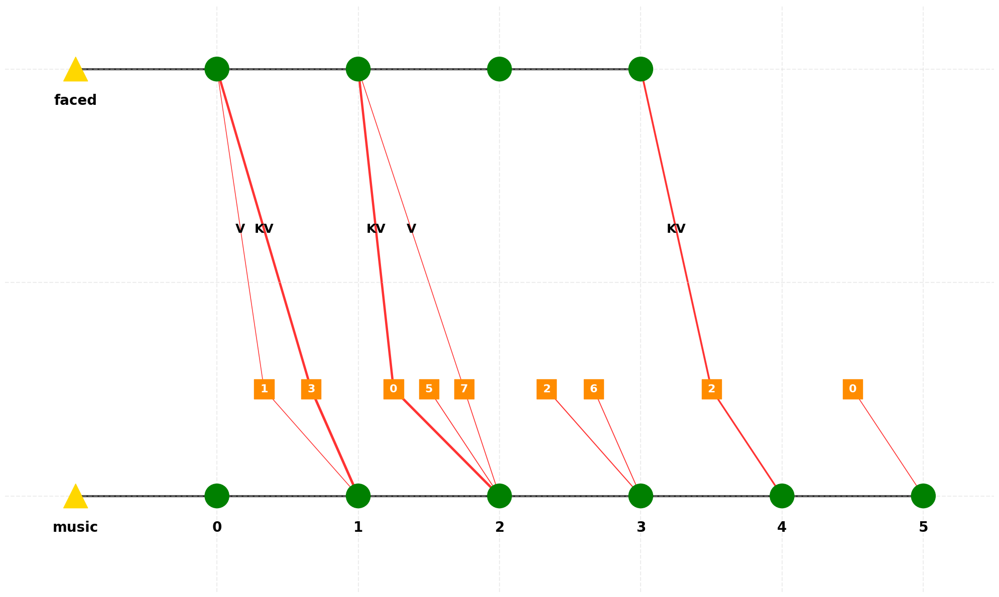

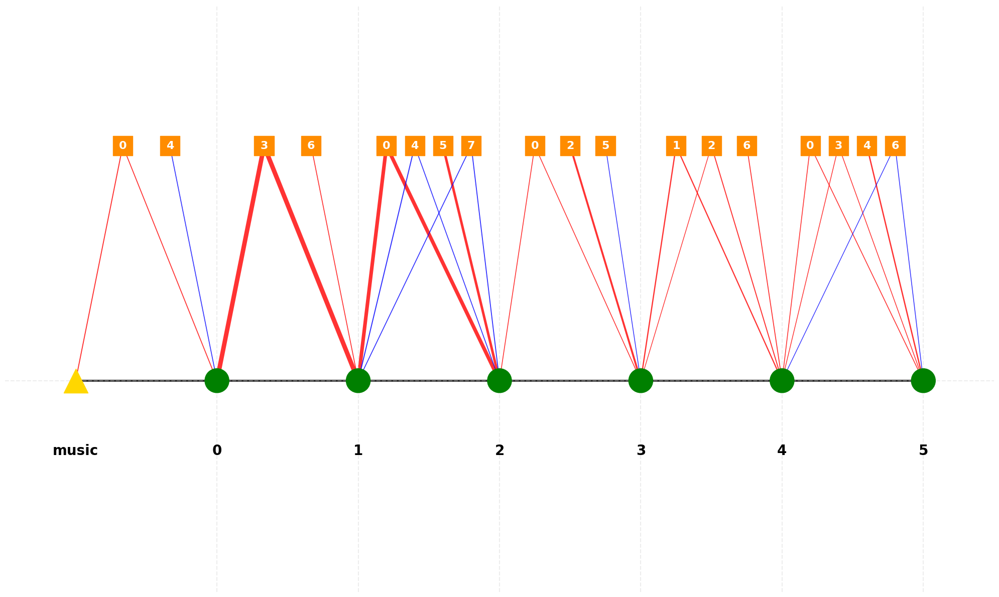

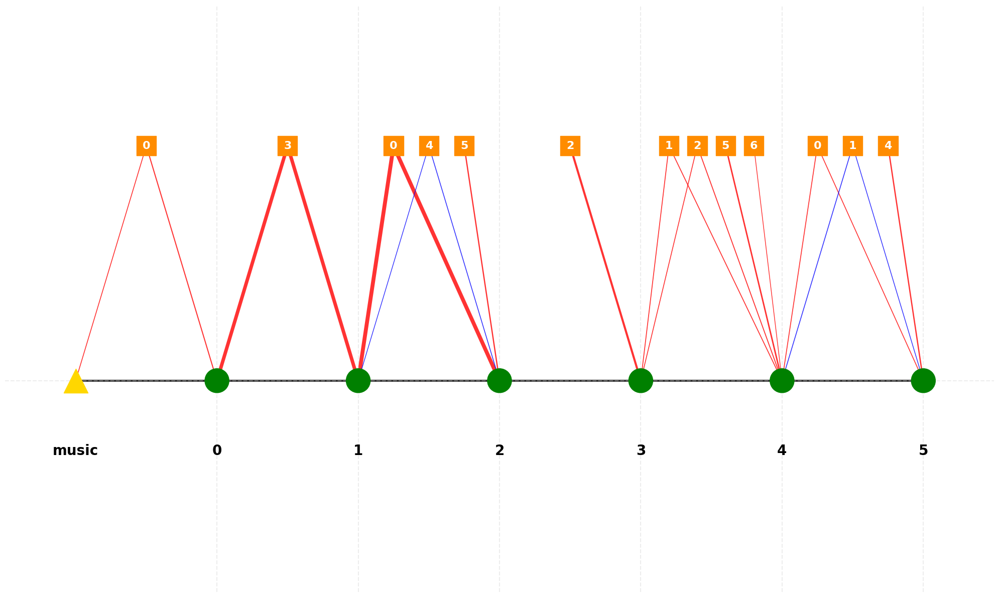

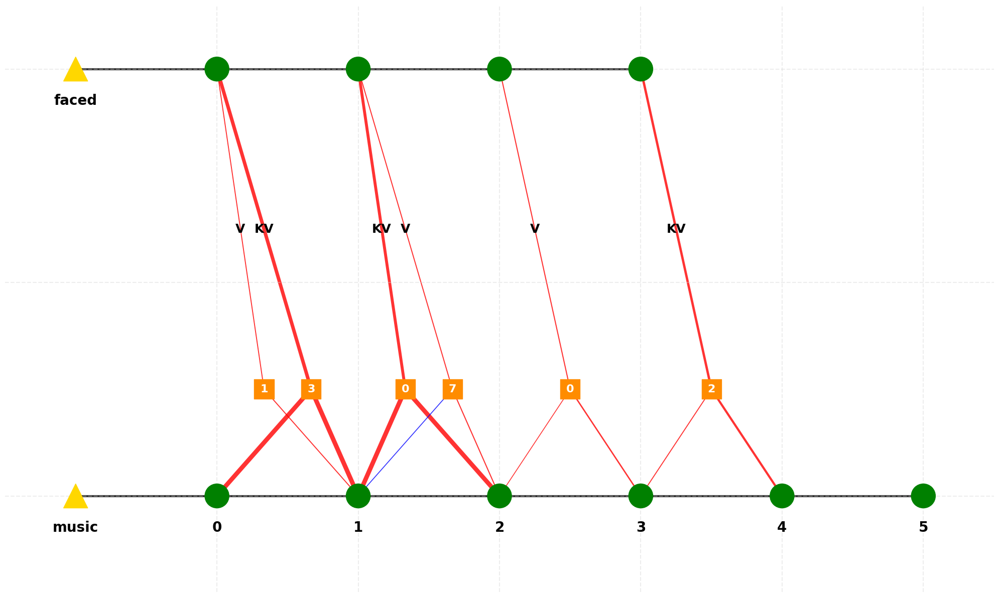


Circuit Summary:
Nodes: 18
Edges: 30

Attention Output Edges by effect size:
  L1H3_T4 → L1_T4 (attn_out): 0.0890
  L2H0_T4 → L2_T4 (attn_out): 0.0861
  L4H2_T4 → L4_T4 (attn_out): 0.0260
  L3H0_T4 → L3_T4 (attn_out): 0.0122
  L2H7_T4 → L2_T4 (attn_out): 0.0080
  L1H1_T4 → L1_T4 (attn_out): 0.0071

Query/Key/Value Edges by effect size:
  L1_T4 → L2H0_T4 (query): 0.0885
  L0_T4 → L1H3_T4 (query): 0.0879
  L0_T2 → L1H3_T4 (key): 0.0590
  L1_T2 → L2H0_T4 (key): 0.0438
  L0_T2 → L1H3_T4 (value): 0.0335
  L3_T2 → L4H2_T4 (value): 0.0309
  L1_T2 → L2H0_T4 (value): 0.0150
  L2_T2 → L3H0_T4 (value): 0.0079
  L1_T2 → L2H7_T4 (value): 0.0072
  L0_T2 → L1H1_T4 (value): 0.0068
  L3_T4 → L4H2_T4 (query): 0.0067
  L3_T2 → L4H2_T4 (key): -0.0061
  L1_T4 → L2H7_T4 (query): -0.0056
  L2_T4 → L3H0_T4 (query): 0.0051


In [74]:
thresholds = [0.006, 0.006, 0.004, 0.005]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,  # Individual thresholds for each
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

In [122]:
all_texts = [original_text] + corrupted_texts
dot_products = simple_acdc.compute_qk_dot_products(
    model=model,
    texts=all_texts,
    layer=2,
    head_idx=0,
    q_index=4,
    k_index=2  
)
print(sum(dot_products[1:3])/2)
print(sum(dot_products[3:5])/2)

Computing Q-K dot products for Layer 2, Head 0 (Q@4, K@2):
Q token at position 4: ' music'
K token at position 2: ' faced'
--------------------------------------------------------------------------------
'He faced the music' -> 80.898178
'He confronted the music' -> 40.221035
'He encountered the music' -> 14.677937
'He faced the musical' -> 7.016785
'He faced the songs' -> -13.735466
--------------------------------------------------------------------------------
27.449485778808594
-3.3593406677246094


# X Call it a Day (I and C's not different enough)

In [ ]:
original_text = "Let's call it a day"
min_token_pos = 4
# target_text="Let's stop working"
target_text="Let's give up"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' call', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' day', top_k=50)

Original text tokens: ['<bos>', 'Let', "'", 's', ' call', ' it', ' a', ' day']
Token at position 4: ' call'
Target token: ' call' (ID: 2409)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' call':
------------------------------------------------------------
 1. Token ID   2409: ' call' (similarity: 1.0000)
 2. Token ID  10342: ' Call' (similarity: 0.8126)
 3. Token ID   4925: 'call' (similarity: 0.8124)
 4. Token ID   5337: 'Call' (similarity: 0.7636)
 5. Token ID  41439: ' CALL' (similarity: 0.7059)
 6. Token ID   9712: ' calls' (similarity: 0.7057)
 7. Token ID  27799: 'CALL' (similarity: 0.6188)
 8. Token ID  11816: ' calling' (similarity: 0.6099)
 9. Token ID  51292: 'calls' (similarity: 0.5024)
10. Token ID  66781: ' Calls' (similarity: 0.4874)
11. Token ID   3151: ' called' (similarity: 0.4773)
12. Token ID  66084: 'Calls' (similarity: 0.4521)
13. Token ID  48049: '调用' (similarity: 0.4326)
14. Token ID 

Analyzing similarities to target sentence: 'Let's give up'
Comparing 6 sentences across layers...


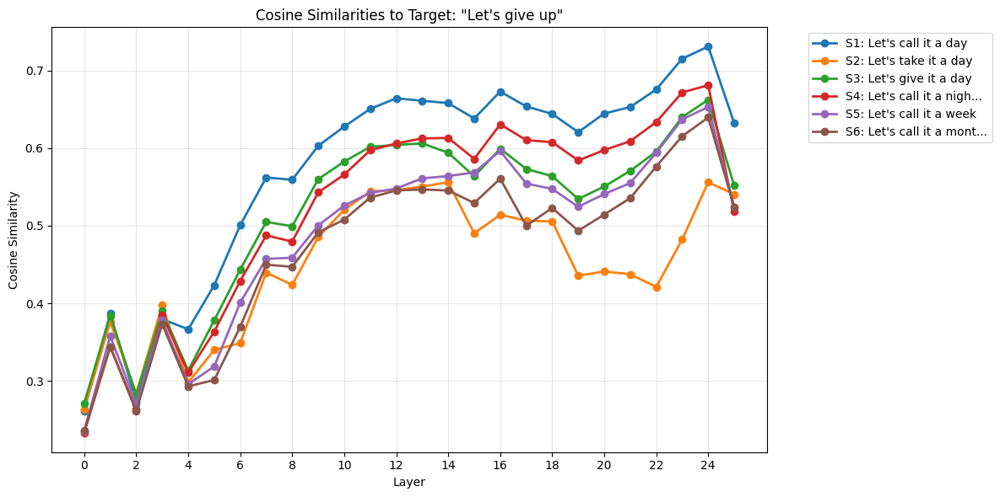

In [ ]:
gemma_utils.plot_target_similarities(model,
                                     sentences=["Let's call it a day", "Let's take it a day", "Let's give it a day", "Let's call it a night", "Let's call it a week", "Let's call it a month"],
                                     target_sentence=target_text)

In [ ]:
max_layer = 4
corrupted_texts = ["Let's take it a day", "Let's give it a day", "Let's call it a night", "Let's call it a week"]

Threshold Sweep: 100%|██████████| 20/20 [01:49<00:00,  5.49s/it]


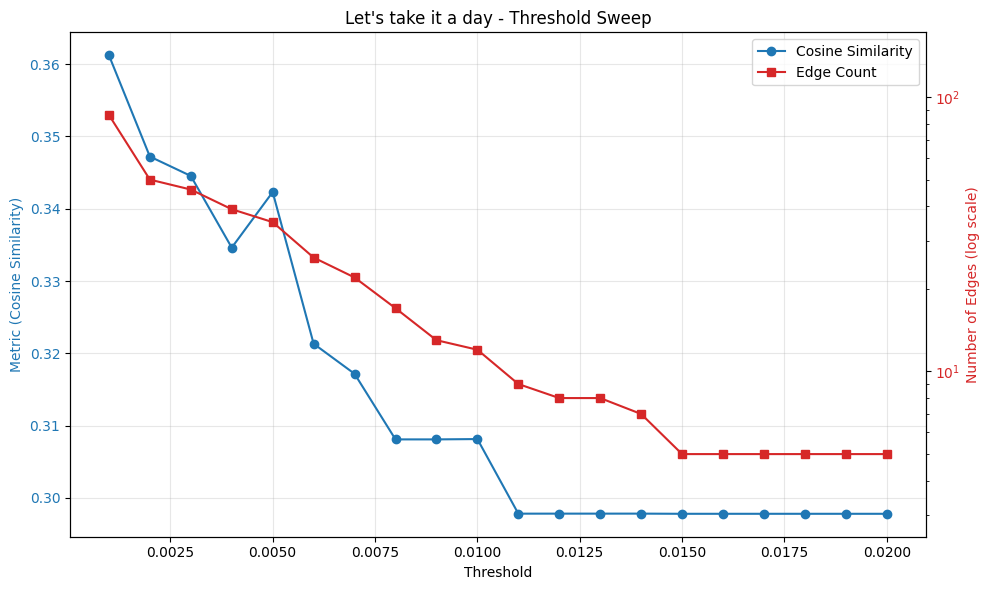

Threshold Sweep: 100%|██████████| 20/20 [01:55<00:00,  5.75s/it]


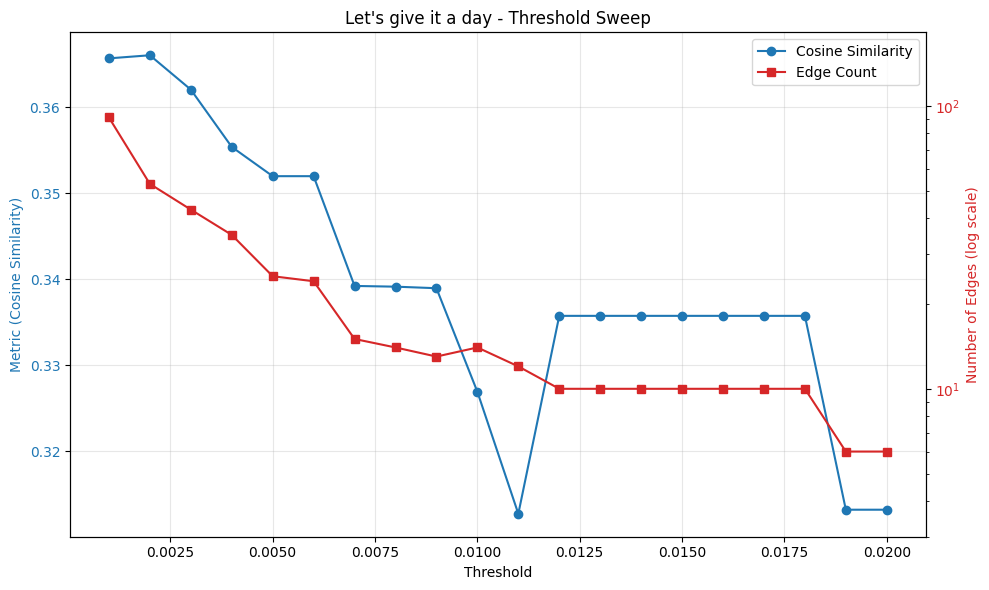

Threshold Sweep: 100%|██████████| 20/20 [00:55<00:00,  2.78s/it]


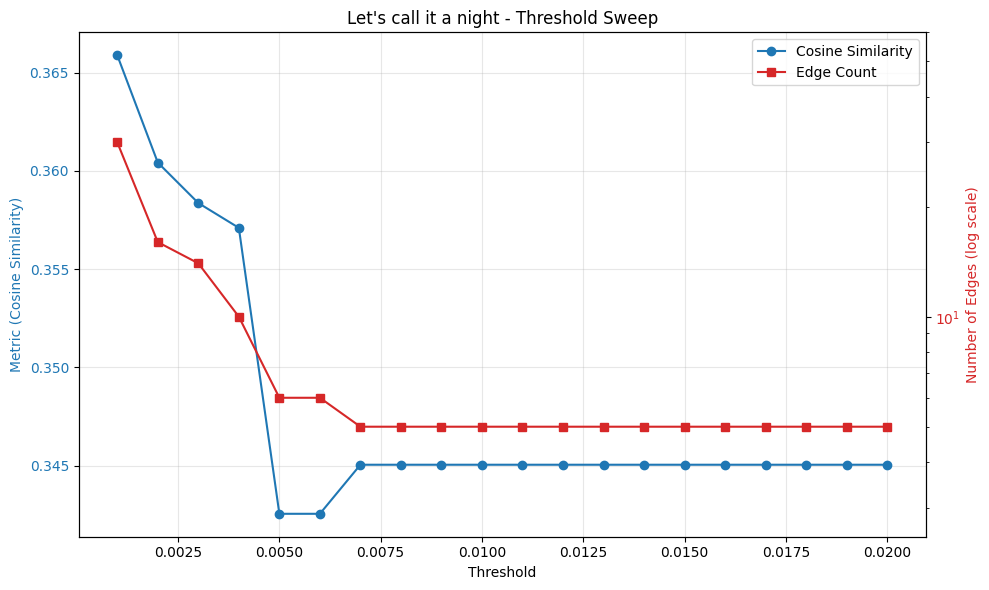

Threshold Sweep: 100%|██████████| 20/20 [01:00<00:00,  3.04s/it]


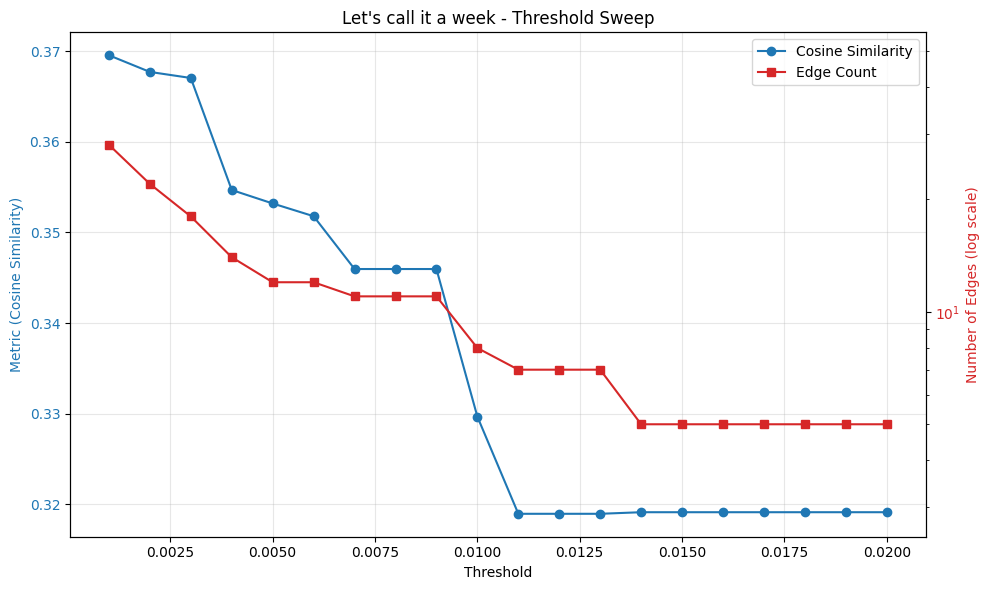

In [ ]:
_ = simple_acdc.multi_corrupted_threshold_sweep(model, max_layer=max_layer,
                                      original_text=original_text,
                                      corrupted_texts=corrupted_texts,
                                      target_text=target_text,
                                      min_token_pos=min_token_pos,
                                      thresholds=(0.001, 0.04, 0.001),
                                      corrupt_q=True,
                                      separate_kv=True)

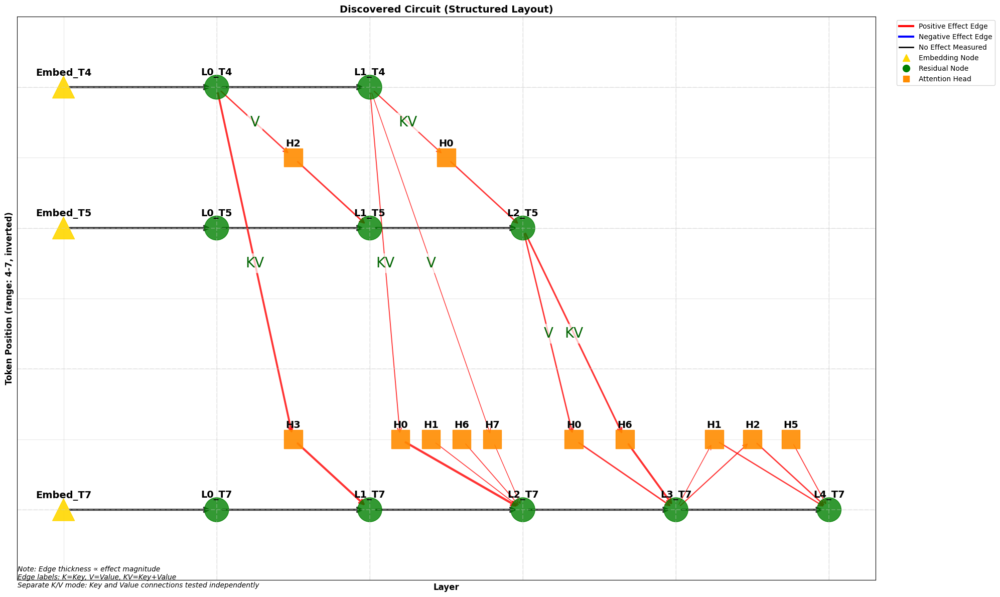

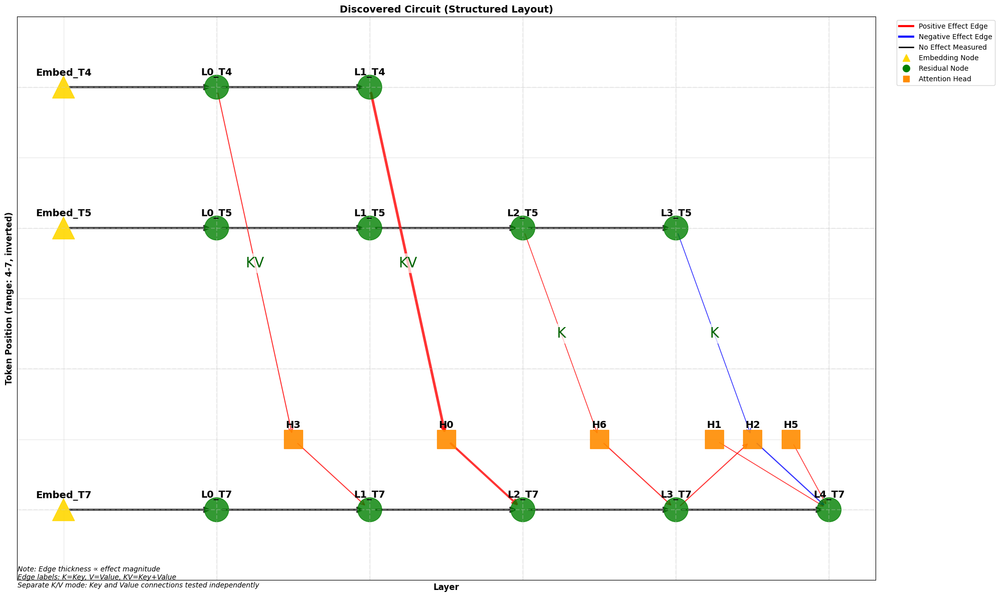

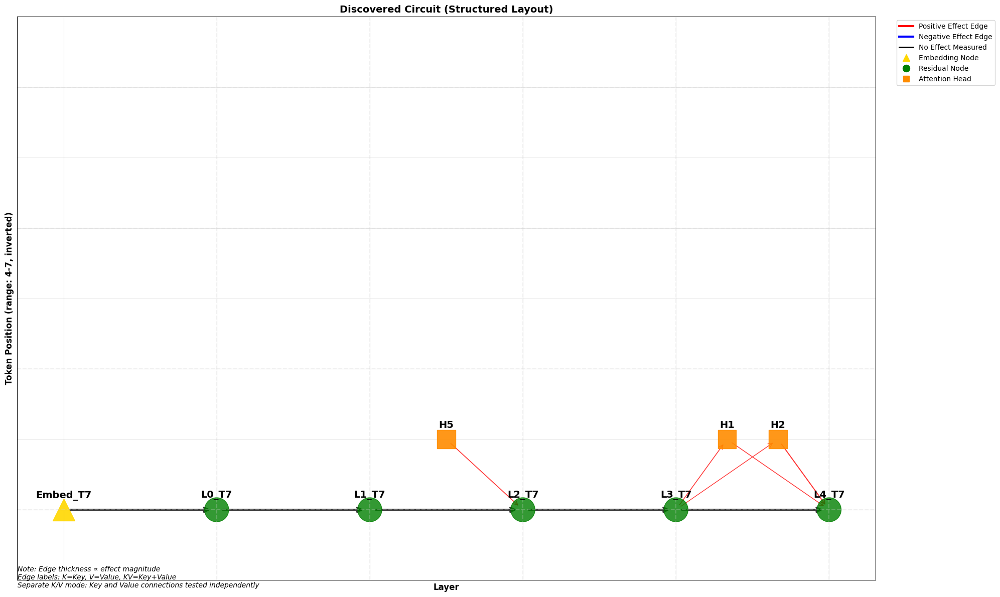

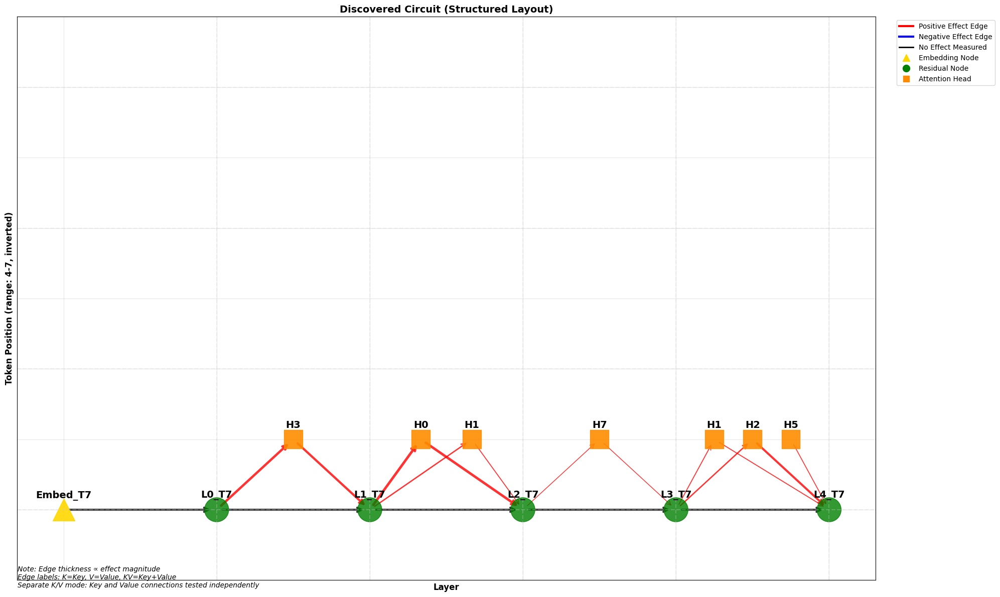

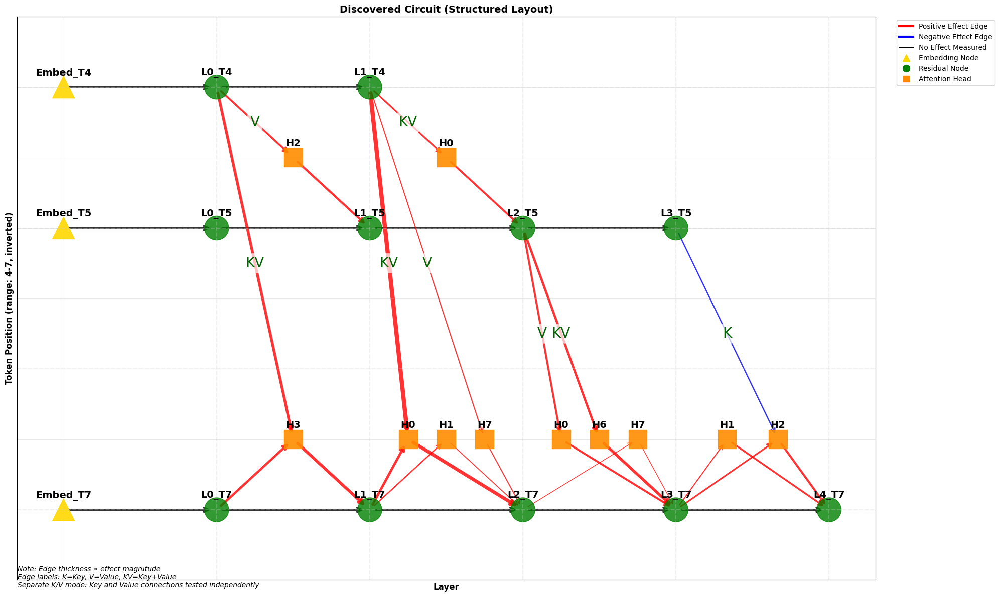


Circuit Summary:
Nodes: 25
Edges: 40

Edges by effect size:
  L1_T4 → L2H0_T7 (value): 0.0393
  L2H0_T7 → L2_T7 (attn_out): 0.0285
  L1H3_T7 → L1_T7 (attn_out): 0.0234
  L3H6_T7 → L3_T7 (attn_out): 0.0218
  L0_T4 → L1H3_T7 (key): 0.0211
  L1_T4 → L2H0_T7 (key): 0.0204
  L1_T7 → L2H0_T7 (query): 0.0185
  L0_T7 → L1H3_T7 (query): 0.0170
  L2_T5 → L3H6_T7 (value): 0.0168
  L1H2_T5 → L1_T5 (attn_out): 0.0153
  L4H2_T7 → L4_T7 (attn_out): 0.0143
  L3H0_T7 → L3_T7 (attn_out): 0.0137
  L2_T5 → L3H0_T7 (value): 0.0132
  L2H0_T5 → L2_T5 (attn_out): 0.0130
  L0_T4 → L1H2_T5 (value): 0.0127
  L4H1_T7 → L4_T7 (attn_out): 0.0114
  L2_T5 → L3H6_T7 (key): 0.0109
  L1_T4 → L2H0_T5 (key): 0.0101
  L3_T7 → L4H2_T7 (query): 0.0100
  L0_T4 → L1H3_T7 (value): 0.0097
  L1_T7 → L2H1_T7 (query): 0.0074
  L1_T4 → L2H0_T5 (value): 0.0069
  L3_T5 → L4H2_T7 (key): -0.0069
  L3_T7 → L4H1_T7 (query): 0.0055
  L1_T4 → L2H7_T7 (value): 0.0054
  L2H7_T7 → L2_T7 (attn_out): 0.0050
  L2H1_T7 → L2_T7 (attn_out): 0.0043


In [ ]:
thresholds = [0.005, 0.006, 0.004, 0.003]

merged_circuit, individual_circuits, metrics = simple_acdc.build_and_merge_circuits(
    model=model,
    max_layer=max_layer,
    original_text=original_text,
    corrupted_texts=corrupted_texts,
    target_text=target_text,
    thresholds=thresholds,  # Individual thresholds for each
    min_token_pos=min_token_pos,
    corrupt_q=True,
    separate_kv=True,
    quiet=True,
    visualize_individual=True
    # save_individual_paths=[
    #     "circuits/individual_circuit_1.png",
    #     "circuits/individual_circuit_2.png"
    # ]
)

acdc_visualizer = simple_acdc.SimpleACDC(model, max_layer=max_layer, threshold=min(thresholds), corrupt_q=True, separate_kv=True)
acdc_visualizer.visualize_circuit(merged_circuit, 
                                #  save_path="circuits/merged_circuit.png",
                                 min_token_pos=min_token_pos)

In [ ]:
all_texts = [original_text] + corrupted_texts
dot_products = simple_acdc.compute_qk_dot_products(
    model=model,
    texts=all_texts,
    layer=0,
    head_idx=5,
    q_index=7,
    k_index=4
)

Computing Q-K dot products for Layer 0, Head 5 (Q@7, K@4):
Q token at position 7: ' day'
K token at position 4: ' call'
--------------------------------------------------------------------------------
'Let's call it a day' -> -14.092974
'Let's take it a day' -> -35.577454
'Let's give it a day' -> 19.124693
'Let's call it a night' -> -6.982931
'Let's call it a week' -> -17.907391
--------------------------------------------------------------------------------


# X Cut some slack (no good corruptions for slack)

In [ ]:
original_text = "Please cut her some slack"
min_token_pos = 2
target_text="Please be lenient with her"
print(f"Original text tokens: {gemma_utils.detokenize(model, original_text)}")
print(f"Token at position {min_token_pos}: '{gemma_utils.detokenize(model, original_text)[min_token_pos]}'")

_ = gemma_utils.find_similar_tokens_by_embedding(model, ' cut', top_k=50)
_ = gemma_utils.find_similar_tokens_by_embedding(model, ' slack', top_k=500)

Original text tokens: ['<bos>', 'Please', ' cut', ' her', ' some', ' slack']
Token at position 2: ' cut'
Target token: ' cut' (ID: 3652)
Embedding matrix shape: torch.Size([256000, 2304])
Target embedding shape: torch.Size([2304])

Top 50 tokens most similar to ' cut':
------------------------------------------------------------
 1. Token ID   3652: ' cut' (similarity: 1.0000)
 2. Token ID   7748: 'cut' (similarity: 0.8251)
 3. Token ID  17091: ' Cut' (similarity: 0.8002)
 4. Token ID  25157: 'Cut' (similarity: 0.7700)
 5. Token ID  21006: ' cuts' (similarity: 0.6853)
 6. Token ID  66177: ' CUT' (similarity: 0.6740)
 7. Token ID  13565: ' cutting' (similarity: 0.6109)
 8. Token ID  63554: 'CUT' (similarity: 0.5996)
 9. Token ID  60232: 'カット' (similarity: 0.5267)
10. Token ID 115409: ' Cuts' (similarity: 0.5047)
11. Token ID  37498: 'cuts' (similarity: 0.4995)
12. Token ID  59640: 'cutting' (similarity: 0.4776)
13. Token ID  61659: ' Cutting' (similarity: 0.4530)
14. Token ID 100592: 'C

# QK Tests

In [103]:
# Compare Q-K interactions across 4 different idiom texts
texts = [
    "He kicked the bucket", 
    "He hit the sack", 
    "He missed the boat", 
    "He faced the music"
]

# Get 4x4 matrix of Q-K dot products for layer 2, head 0
# Comparing queries from the final token with keys from the verb token
matrix = simple_acdc.compute_qk_cross_matrix(model, texts, layer=2, head_idx=0, q_index=4, k_index=2)

Computing Q-K cross matrix for Layer 2, Head 0 (Q@4, K@2):
Matrix size: 4x4 (rows=query text, cols=key text)
Q token at position 4: ' bucket'
K token at position 2: ' kicked'
--------------------------------------------------------------------------------
Texts:
  0: 'He kicked the bucket'
  1: 'He hit the sack'
  2: 'He missed the boat'
  3: 'He faced the music'
--------------------------------------------------------------------------------

Q-K Dot Product Matrix:
Rows: Query text, Columns: Key text
            0         1         2         3
  0 72.441681 50.428066  9.668571 21.991749
  1 14.405466 80.928543 25.334408 44.020729
  2 17.580036  6.170414 69.838943  8.116570
  3  8.024591 40.409843 -0.122783 80.898178
--------------------------------------------------------------------------------
